EDA into `modules.csv`, focusing only on the fields of potential interest.

In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import networkx as nx
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords

sns.set_theme()

# location of modules.csv - get path of current working directory, then go up one level, then navigate to modules.csv in ./data/
modules_path = Path.cwd().parent.joinpath('data/raw/modules.csv')

# load modules.csv, semi-colon is the separator used in the file 
modules_raw = pd.read_csv(modules_path, sep = ';')

# retain only fields of potential interest
modules_raw_reduced = modules_raw[['ModuleCode', 'Title', 'ShortTitle', 'IsNew', 'Semester1Offered', 'Semester1CreditValue',
                                   'Semester2Offered', 'Semester2CreditValue','Semester3Offered', 'Semester3CreditValue',
                                   'EctsCreditValue', 'FheqLevel', 'Delivery', 'IsOffered', 'PreRequisiteComment',
                                   'CoRequisiteComment', 'SchoolCode', 'TeachingLocation', 'Aims', 'OutlineOfSyllabus',
                                   'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes', 'SapObjectId', 'IsDummy', 'Module_Id'
                                  ]]

# set this notebook to display all retained columns in tabular output
pd.options.display.max_columns = 25

In [2]:
print(f'Number of records: {len(modules_raw_reduced)}\n')

# first 5 records
modules_raw_reduced.head()

Number of records: 5359



,ModuleCode,Title,ShortTitle,IsNew,Semester1Offered,Semester1CreditValue,Semester2Offered,Semester2CreditValue,Semester3Offered,Semester3CreditValue,EctsCreditValue,FheqLevel,Delivery,IsOffered,PreRequisiteComment,CoRequisiteComment,SchoolCode,TeachingLocation,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes,SapObjectId,IsDummy,Module_Id
0,ACC2002,Managerial and Business Economics,Managerial and Business Economics,False,True,10,True,10,False,0,10,5,ST,True,NaN,None,D-NUBS,Newcastle City Campus,To introduce students to economic issues and d...,OPTIMISATION: A BRIEF REVIEW\r\n\r\nCONSUMPTI...,At the end of this module students will be abl...,At the end of this module students will be abl...,50340718,False,104529
1,ACC2003,Financial Control,Financial Control,False,True,10,True,10,False,0,10,5,ST,True,NaN,Non,D-NUBS,Newcastle City Campus,(a) To provide a framework of the methods ...,The module is delivered by means of a series o...,By the end of the module students will be able...,By the end of the module students will be able...,50340719,False,104530
2,ACC2005,Intermediate Financial Accounting,Intermediate Financial Accounting,False,True,10,True,10,False,0,10,5,ST,True,NaN,None,D-NUBS,Newcastle City Campus,1. To examine current financial reporting prac...,1. Company Financial Statements\r\n\r\n2. The ...,"By the end of the module, students should be a...","By the end of the module, students should be a...",50340720,False,104531
3,ACC2007,Responsible Corporate Finance,Responsible Corporate Finance,False,True,10,True,10,False,0,10,5,ST,True,Equivalent Stage 1 Maths Statistics module,None,D-NUBS,Newcastle City Campus,This module aims for develop an understanding ...,1- Scope and nature of corporate finance\r\n2-...,By the end of the module students will be able...,By the end of the module students will acquire...,50340721,False,104532
4,ACC2008,Introduction to Corporate Finance,Introduction to Corporate Finance,False,True,10,False,0,False,0,5,5,ST,True,Sufficient Knowledge of Maths and Stats and In...,None,D-NUBS,Newcastle City Campus,To provide an analytical framework for the kno...,1- Scope and nature of corporate finance\r\n2-...,By the end of the module students will be able...,1. Financial Analysis\r\n2. Critical evaluat...,50604711,False,104533


We first attempt to discern the nature of `IsDummy`.

In [3]:
# records where IsDummy == True
isdummy_records = modules_raw_reduced.loc[modules_raw_reduced['IsDummy'] == True]

print(f'Number of IsDummy records: {len(isdummy_records)}\n')
print(f'IsDummy record Title and natural language fields:')
display(isdummy_records[['Title', 'Aims', 'OutlineOfSyllabus', 'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes']])

Number of IsDummy records: 48

IsDummy record Title and natural language fields:


,Title,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes
98,Stage 1 BDS; Examination & Assessment,Original Summary:,NaN,NaN,NaN
99,Stage 2 BDS; Examination & Assessment,Original Summary:,NaN,NaN,NaN
100,Stage 3 BDS; Examination & Assessment,Original Summary:,NaN,NaN,NaN
101,Stage 4 BDS; Examination & Assessment,Original Summary:,NaN,NaN,NaN
102,Stage 5 BDS; Examination & Assessment,Original Summary:,NaN,NaN,NaN
798,English for Undergraduate Studies (September),Original Summary:,NaN,NaN,NaN
799,English for Undergraduate Studies (January),Original Summary:,NaN,NaN,NaN
800,English for Undergraduate Studies (April),Original Summary:,NaN,NaN,NaN
801,English for Undergraduate Studies (June),Original Summary:,NaN,NaN,NaN
802,Academic English (Term 1),Original Summary:,NaN,NaN,NaN


Most of the `IsDummy == True` records contain missing (`NaN`) or meaningless values in their natural language fields, rendering them useless for further analysis. They are likely to be template modules. Records corresponding to IDs `1939` and `4861` don't follow this trend. We look at them more closely.

In [4]:
# records 1939 and 4861, interesting IsDummy == True cases
isdummy_records_subset = isdummy_records.loc[[1939, 4861]]

# increase width of columns in tabular output to be arbitrarily high, to allow the full text passages below to be read
pd.options.display.max_colwidth = 2500

display(isdummy_records_subset[['Title', 'Aims', 'OutlineOfSyllabus', 'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes']])

,Title,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes
1939,Scholarship in Medical Education,"•To establish an academic framework for understanding and studying education as a discipline.\r\n•To introduce the student to research principles and practices that are relevant to educational research within a health care context. \r\n\r\n\r\nSummary:\r\nThe focus for this module is engaging students with education as an academic discipline rather than just a component of clinical practice. As a social science, education is very different academically from medicine, therefore the module will facilitate student transition from the philosophies underpinning medical thinking to those underpinning education and medical education. Within that new framework, the module will cover research methods and the critical appraisal of research outputs.","•The nature of scholarship \r\n•Critically evaluating the outputs from scholarly activity and specifically how to critique an education research paper\r\n•The different theoretical perspectives and research approaches used within medical education\r\n•Common methods used in educational research for data collection, sampling and analysis\r\n•The assessment of quality and rigour within medical education studies\r\n•Ethical challenges as they relate to education research","On completion of this module students should be able to:\r\n\r\n•Distinguish between models, theories and paradigms used in education and education research and those used in other disciplines\r\n•Distinguish between the different approaches used within educational enquiries\r\n•Recognise the factors that may influence research design\r\n•Differentiate between statistical terms and identify factors affecting the choice of statistical tests commonly used in medical education","On completion of this module students should be able to:\r\n\r\n• Critically appraise the outputs from educational research, including:\r\no The methods adopted and the coherence between these and the intent of a study\r\no The quality and rigour of the research process \r\no The assumptions of researchers and the effect these have on the study design\r\n\r\n• Propose realistic amendments to improve flawed studies and reports"
4861,Student Support (January pathway start),"This module is designed to help international students develop competence in and awareness of\r\nacademic English in order to successfully start an undergraduate degree programme in the UK. It is\r\nspecifically designed for students starting the module at an intermediate English language level\r\n(approximately IELTS 5.5, CEFR B2). This enhanced 40 credit module is designed to provide students with extensive practice and development time. The module’s specific aims are: \r\n•\tTo develop skills and knowledge in academic writing to meet the expectations of the undergraduate academic community at UK HEIs\r\n•\tTo develop strategies for reading academic texts in English in order to exploit key text content for further study purposes including written work, seminar discussion and oral seminar presentation\r\n•\tTo introduce note-taking skills and to extend this into summarising of key ideas from written and oral texts\r\n•\tTo develop an awareness of how secondary sources are to be integrated into student writing so that recognition and respect of source origins are demonstrated and plagiarism is avoided\r\n•\tTo raise awareness of academic lecture structure and the strategies required in order to follow and understand lecture content, lecturer behaviour, and lecturer discourse choices \r\n•\tTo develop spoken English skills for social and academic spoken interactional contexts, such as seminar discussions, oral presentations, 1-1 tutorials, group work discussions, and informal conversations. \r\n•\tTo further extend knowledge and awareness of English grammar, vocabulary and pronunciation features so that academic and socio/cultural assimilation can easily occur","Developin

Both records, despite being flagged with `IsDummy`, seem to contain natural language like that you would expect from a legitimate module. Since this `IsDummy` flag is unusual, we attempt to see if other modules exist that are analogous to these two modules.

In [5]:
# return column width to normal
pd.options.display.max_colwidth = 50

# get interesting IsDummy == True record Aims values
isdummy_records_subset_aims = isdummy_records_subset[['Aims']].values

# display records that have identical content in Aims to the two interesting IsDummy records
modules_raw_reduced[modules_raw_reduced['Aims'].isin(isdummy_records_subset_aims.reshape(2))]

,ModuleCode,Title,ShortTitle,IsNew,Semester1Offered,Semester1CreditValue,Semester2Offered,Semester2CreditValue,Semester3Offered,Semester3CreditValue,EctsCreditValue,FheqLevel,Delivery,IsOffered,PreRequisiteComment,CoRequisiteComment,SchoolCode,TeachingLocation,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes,SapObjectId,IsDummy,Module_Id
743,INU0102,English for Academic Purposes (40 Credits Vers...,EAP (40 credits),False,True,20,True,20,False,0,20,3,ST,True,IELTS 5.5 (or equivalent) with minimum 5.0 in ...,NaN,D-INTO,Newcastle City Campus,This module is designed to help international ...,"Developing grammar, vocabulary, pronunciation ...",At the end of this module the learner will: \r...,At the end of the module the learner will be a...,50855214,False,105339
763,INU0502,English for Academic Purposes (40 Credits Vers...,EAP (40 credits),False,True,20,True,20,False,0,20,3,ST,True,IELTS 5.5 (or equivalent) with minimum 5.0 in ...,NaN,D-INTO,Newcastle City Campus,This module is designed to help international ...,"Developing grammar, vocabulary, pronunciation ...",At the end of this module the learner will: \r...,At the end of the module the learner will be a...,50919213,False,105360
1939,MEM8064,Scholarship in Medical Education,Scholarship in Medical Education,False,True,10,True,10,False,0,10,7,BL,False,NaN,NaN,D-SME,Malaysia,•To establish an academic framework for unders...,•The nature of scholarship \r\n•Critically eva...,On completion of this module students should b...,On completion of this module students should b...,51979085,True,106609
2133,INU0103,English for Academic Purposes - Foundation Sci...,EAP (40 credits),False,True,20,True,20,False,0,20,3,ST,True,IELTS 5.5 (or equivalent) with minimum 5.0 in ...,NaN,D-INTO,Newcastle City Campus,This module is designed to help international ...,"Developing grammar, vocabulary, pronunciation ...",At the end of this module the learner will: \r...,At the end of the module the learner will be a...,51643131,False,106822
2134,INU0503,English for Academic Purposes - Foundation Sci...,EAP (40 credits),False,True,20,True,20,False,0,20,3,ST,True,IELTS 5.5 (or equivalent) with minimum 5.0 in ...,NaN,D-INTO,Newcastle City Campus,This module is designed to help international ...,"Developing grammar, vocabulary, pronunciation ...",At the end of this module the learner will: \r...,At the end of the module the learner will be a...,51643130,False,106823
2747,INU0523,English for Academic Purposes for Foundation A...,EAP FDN ARC (40 credits),False,True,20,True,20,False,0,20,3,ST,True,IELTS 5.5 (or equivalent) with minimum 5.0 in ...,NaN,D-INTO,Newcastle City Campus,This module is designed to help international ...,"Developing grammar, vocabulary, pronunciation ...",At the end of this module the learner will: \r...,At the end of the module the learner will be a...,52183375,False,107555
3550,MEE8074,Scholarship in Medical Education,Scholarship in Medical Education,False,True,10,True,10,False,0,10,7,EL,True,NaN,NaN,D-SME,Off Campus,•To establish an academic framework for unders...,•The nature of scholarship \r\n•Critically eva...,On completion of this module students should b...,On completion of this module students should b...,52414534,False,108421
4861,INU9105,Student Support (January pathway start),Student Support (Jan Acad.),False,True,20,True,20,False,0,20,3,ST,True,IELTS 5.5 (or equivalent) with minimum 5.0 in ...,NaN,D-INTO,Newcastle City Campus,This module is designed to help international ...,"Developing grammar, vocabulary, pronunciation ...",At the end of this module the learner will: \r...,At the end of the module the learner will be a...,0,True,109789


From the above, we see that both our interesting `IsDummy` cases share identical text in the their `Aims` fields with other records, and possibly in the other natural language fields too. Therefore, they are likely to be template modules for the other modules shown above, which are flagged `IsDummy == False`.

From the above exploratory analysis, we can categorically state that each record with `IsDummy == True` can be disregarded, and that upon doing so, we can delete the field; this field almost certainly refers to template modules. This is a reasonable thing to do as the interest in conducting Semantic Textual Similarity and Topic Analysis here is such that ordinary modules can be related, it would thus be undesirable to do this for template modules.

The remaining EDA will be done with `IsDummy == True` records and the `IsDummy` field removed.

In [6]:
# remove IsDummy == True records from EDA
modules_raw_reduced_nondummy = modules_raw_reduced.loc[modules_raw_reduced['IsDummy'] == False]
# drop IsDummy field
modules_raw_reduced_nondummy = modules_raw_reduced_nondummy.drop(columns = 'IsDummy')

print(f'Number of non-dummy records: {len(modules_raw_reduced_nondummy)} \
      ({len(modules_raw_reduced) - len(modules_raw_reduced_nondummy)} removed in total)')

Number of non-dummy records: 5311       (48 removed in total)


We note the cases of duplicate natural language values in the above table. The *modules.csv* `ydata-profiling` report states that the natural language fields are each less than 90% distinct, there is hence many more cases of records that have identical values in these fields. We now investigate this natural language duplication.

In [7]:
# find non-distinct natural language values, retaining all duplications
aims_oos_iko_iso_duplicates = modules_raw_reduced_nondummy[modules_raw_reduced_nondummy.duplicated(
    subset = ['Aims', 'OutlineOfSyllabus', 'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes'], keep = False)]
aims_duplicates = modules_raw_reduced_nondummy[modules_raw_reduced_nondummy.duplicated(
    subset = ['Aims'], keep = False)]
oos_duplicates = modules_raw_reduced_nondummy[modules_raw_reduced_nondummy.duplicated(
    subset = ['OutlineOfSyllabus'], keep = False)]
iko_duplicates = modules_raw_reduced_nondummy[modules_raw_reduced_nondummy.duplicated(
    subset = ['IntendedKnowledgeOutcomes'], keep = False)]
iso_duplicates = modules_raw_reduced_nondummy[modules_raw_reduced_nondummy.duplicated(
    subset = ['IntendedSkillOutcomes'], keep = False)]

print(f'Number of records with all non-distinct natural language values: {len(aims_oos_iko_iso_duplicates)}')
print(f'Number of records with non-distinct Aims value (and possibly others): {len(aims_duplicates)}')
print(f'Number of records with non-distinct OutlineOfSyllabus value (and possibly others): {len(oos_duplicates)}')
print(f'Number of records with non-distinct IntendedKnowledgeOutcomes value (and possibly others): {len(iko_duplicates)}')
print(f'Number of records with non-distinct IntendedSkillOutcomes value (and possibly others): {len(iso_duplicates)}')

Number of records with all non-distinct natural language values: 690
Number of records with non-distinct Aims value (and possibly others): 1187
Number of records with non-distinct OutlineOfSyllabus value (and possibly others): 1218
Number of records with non-distinct IntendedKnowledgeOutcomes value (and possibly others): 1425
Number of records with non-distinct IntendedSkillOutcomes value (and possibly others): 1497


Evidently, the proportion of records with non-distinct natural language values is quite significant and this non-distinctness varies dramatically across the fields. We see that 690 records are entirely non-distinct in this manner; we look at them first.

In [8]:
# combine ModuleCode values that are identical in all natural language fields
aims_oos_iko_iso_duplicates_grouped = aims_oos_iko_iso_duplicates.groupby([
    'Aims', 'OutlineOfSyllabus', 'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes'
])['ModuleCode'].apply(list).reset_index(name = 'Module_Codes')
display(aims_oos_iko_iso_duplicates_grouped)

,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes,Module_Codes
0,'Why does everyone enjoy rhythm and music?' as...,The module begins with an overview of the type...,"On completion of the module, students should h...","On completion of the module, students should h...","[CAC2057, CAC3057]"
1,(a) To provide a framework of the methods ...,The module is delivered by means of a series o...,By the end of the module students will be able...,By the end of the module students will be able...,"[ACC2003, ACC2024, LAC2003]"
2,(a) To introduce students to the responsibilit...,Outline Of Syllabus\r\n1.\tThe framework of th...,By the end of the module students will be able...,By the end of the module students will be able...,"[ACC3002, LAC3002]"
3,-\tTo acquire familiarity with the main legal ...,A.\tAn introduction to Law and the English Leg...,"At the end of the module, students will be abl...","At the end of the module, students will be abl...","[LAW8142, LLA1054]"
4,- To enhance students’ multifaceted understand...,Semester 1\r\n•\tDecision to Internationalise ...,By the end of the module students will be able...,At the end of the module students will have de...,"[MKT2052, LMK2052]"
...,...,...,...,...,...
218,• To provide students with an introductory app...,1. Introduction to Strategy (1)\r\n2. Introduc...,After completing the module students should be...,After completing the module students should be...,"[LBS8078, NBS8978]"
219,• to provide a supported research environment ...,"Students propose, structure and carry out a re...","For Creative Practice, detailed and high-level...","For Creative Practice, high-level mastery of:\...","[MUS8161, MUS8162]"
220,•To encourage students to explore socio-cultur...,‘Fashions’ and trends in health care education...,On completion of this module students will be ...,On completion of this module students will be ...,"[MEE8078, MEE8081]"
221,"•To introduce students to the principles, theo...",Theories and principles in programme and curri...,On completion of this module the student will ...,On completion of this module the student will ...,"[MEM8061, MEE8073]"


In the above, we have grouped records that share values in all four of the natural language fields, using `ModuleCode` as a reference. Even though we have not retained the rest of the fields, they can be easily recovered since `ModuleCode` functions as a primary key. From this, we have 223 groups, meaning that 467 modules are duplicates in all natural language fields.

It would be redundant to feed records that are duplicates in their natural language fields into a model. This grouping methodology provides a framework to model one document per module grouping while retaining the association of the semantic information to each textually non-distinct record.

We now identify the number of records that are non-distinct in exactly three natural language fields, for each combination of three natural language fields.

In [9]:
# get list of records that are duplicates in all four natural language fields, using ModuleCode as a key
modulecode_duplicates_4 = aims_oos_iko_iso_duplicates['ModuleCode'].values

# remove records that are duplicates in all four natural language fields
modules_raw_reduced_rm4 = modules_raw_reduced_nondummy[~ modules_raw_reduced_nondummy['ModuleCode'].isin(modulecode_duplicates_4)]

# find non-distinct natural language values in exactly three fields, retaining all duplications
aims_oos_iko_duplicates = modules_raw_reduced_rm4[modules_raw_reduced_rm4.duplicated(
    subset = ['Aims', 'OutlineOfSyllabus', 'IntendedKnowledgeOutcomes'], keep = False)]
aims_oos_iso_duplicates = modules_raw_reduced_rm4[modules_raw_reduced_rm4.duplicated(
    subset = ['Aims', 'OutlineOfSyllabus', 'IntendedSkillOutcomes'], keep = False)]
aims_iko_iso_duplicates = modules_raw_reduced_rm4[modules_raw_reduced_rm4.duplicated(
    subset = ['Aims', 'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes'], keep = False)]
oos_iko_iso_duplicates = modules_raw_reduced_rm4[modules_raw_reduced_rm4.duplicated(
    subset = ['OutlineOfSyllabus', 'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes'], keep = False)]

print(f'Number of records with only non-distinct Aims, OutlineOfSyllabus and IntendedKnowledgeOutcomes values: {len(aims_oos_iko_duplicates)}')
print(f'Number of records with only non-distinct Aims, OutlineOfSyllabus and IntendedSkillOutcomes values: {len(aims_oos_iso_duplicates)}')
print(f'Number of records with only non-distinct Aims, IntendedKnowledgeOutcomes and IntendedSkillOutcomes values: {len(aims_iko_iso_duplicates)}')
print(f'Number of records with only non-distinct OutlineOfSyllabus, IntendedKnowledgeOutcomes and IntendedSkillOutcomes values: {len(oos_iko_iso_duplicates)}')

Number of records with only non-distinct Aims, OutlineOfSyllabus and IntendedKnowledgeOutcomes values: 21
Number of records with only non-distinct Aims, OutlineOfSyllabus and IntendedSkillOutcomes values: 40
Number of records with only non-distinct Aims, IntendedKnowledgeOutcomes and IntendedSkillOutcomes values: 129
Number of records with only non-distinct OutlineOfSyllabus, IntendedKnowledgeOutcomes and IntendedSkillOutcomes values: 159


In each combination of the natural language fields, we see non-distinct records.

We look at the records that are non-distinct in only `Aims`, `OutlineOfSyllabus` and `IntendedKnowledgeOutcomes`, specifically looking at `IntendedSkillOutcomes`. To do this, we group records by `Aims`, `OutlineOfSyllabus` and `IntendedKnowledgeOutcomes`, listing the groupings of distinct `ModuleCode` and `IntendedSkillOutcomes` values for comparison.

In [10]:
# combine ModuleCode and IntendedSkillOutcomes values that are identical in all other natural language fields
aims_oos_iko_duplicates_grouped = aims_oos_iko_duplicates.groupby([
    'Aims', 'OutlineOfSyllabus', 'IntendedKnowledgeOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       IntendedSkillOutcomes = ('IntendedSkillOutcomes', list)).reset_index()

# increase width of columns in tabular output to be arbitrarily high, to allow the full text passages below to be read
pd.options.display.max_colwidth = 2500

display(aims_oos_iko_duplicates_grouped[['Module_Codes', 'IntendedSkillOutcomes']].explode('IntendedSkillOutcomes'))

,Module_Codes,IntendedSkillOutcomes
0,"[FRE4081, GER4081, SPA4081, FRE4084]","Subject-Specific skills:\r\n\r\nBy the end of the module, students will have gained experience in:\r\n\r\n- using complex lexical and grammatical structures in a range of advanced discourse types,\r\n- synthesising information from a variety of authentic sources, comprising extended written input from a variety of demanding discourse types\r\n- intensive reading of complex authentic material from a variety of demanding discourse types\r\n- discuss and synthesise complex ideas from a range of extensive authentic texts in groups (both orally and in writing) and produce a forceful and convincing argument in persuasive writing.\r\n\r\nCognitive/intellectual skills:\r\n\r\nStudents will further their ability to:\r\n- locate, make use of and critically evaluate materials for this course other than those provided by the lecturer.\r\n- apply and evaluate a range of learning strategies appropriate to the demands of the course\r\n- work independently and confidently, on their own or as part of a group, either within or outside the classroom \r\n- conduct research using the Internet and other sources in order to contribute their own materials to the course."
0,"[FRE4081, GER4081, SPA4081, FRE4084]","Subject-Specific skills:\r\n\r\nBy the end of the module, students will have gained experience in:\r\n\r\n- using complex lexical and grammatical structures in a range of advanced discourse types,\r\n- synthesising information from a variety of authentic sources, comprising extended written input from a variety of demanding discourse types\r\n- intensive reading of complex authentic material from a variety of demanding discourse types\r\n- extended writing in the target language, focusing particularly on argumentative and synthetic compositions in a formal academic register\r\n- discuss and synthesise complex ideas from a range of extensive authentic texts in groups (both orally and in writing) and produce a forceful and convincing argument in persuasive writing\r\n\r\nCognitive/intellectual skills:\r\n\r\nStudents will further their ability to:\r\n- locate, make use of and critically evaluate materials for this course other than those provided by the lecturer.\r\n- apply and evaluate a range of learning strategies appropriate to the demands of the course\r\n- work independently and confidently, on their own or as part of a group, either within or outside the classroom \r\n- conduct research using the Internet and other sources in order to contribute their own materials to the course."
0,"[FRE4081, GER4081, SPA4081, FRE4084]","Subject-Specific skills:\r\n\r\nBy the end of the module, students will have gained experience in:\r\n\r\n- using complex lexical and grammatical structures in a range of advanced discourse types,\r\n- synthesising information from a variety of authentic sources, comprising extended written input from a variety of demanding discourse types\r\n- intensive reading of complex authentic material from a variety of demanding discourse types\r\n- extended writing in the target language, focusing particularly on argumentative and synthetic compositions in a formal academic register\r\n- discuss and synthesise complex ideas from a range of extensive authentic texts in groups (both orally and in writing) and produce a forceful and convincing argument in persuasive writing.\r\n\r\nCognitive/intellectual skills:\r\n\r\nStudents will further their ability to:\r\n- locate, make use of and critically evaluate materials for this course other than those provided by the lecturer.\r\n- apply and evaluate a range of learning strategies appropriate to the demands of the course\r\n- work independently and confidently, on their own or as part of a group, either within or outside the classroom \r\n- conduct research using the Internet and other sources in order to contribute their own materials to the course."
0,"[FRE4081, GER4081, SPA4081, FRE4084]","Subject-Specifi

Interestingly, if we look at these records, the content in `IntendedSkillOutcomes` appears to be nearly identical for each record grouping; they only differ in negligible aspects like punctuation, formatting characters or brief phrases that don't affect the semantics of the text.

This near identity in these distinct natural language values is likely to be a significant contributor to records being non-distinct in only some of the fields, as opposed to all of them. We now repeat the above process for the remaining 3 combinations of 3 natural language field non-distinctness.

Non-distinct in only `Aims`, `OutlineOfSyllabus` and `IntendedSkillOutcomes`

In [11]:
# combine ModuleCode and IntendedKnowledgeOutcomes values that are identical in all other natural language fields
aims_oos_iso_duplicates_grouped = aims_oos_iso_duplicates.groupby([
    'Aims', 'OutlineOfSyllabus', 'IntendedSkillOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       IntendedKnowledgeOutcomes = ('IntendedKnowledgeOutcomes', list)).reset_index()

display(aims_oos_iso_duplicates_grouped[['Module_Codes', 'IntendedKnowledgeOutcomes']].explode('IntendedKnowledgeOutcomes'))

,Module_Codes,IntendedKnowledgeOutcomes
0,"[NBS8122, NBS9122]","On completion of this module, you will be able to:\r\n\r\n- Develop an understanding of the key financial statements and their analysis,\r\n- Evaluate the concepts of budgeting and short-term decision analysis,\r\n- Understand the fundamentals of financial markets in which firms operate."
0,"[NBS8122, NBS9122]","On completion of this module, you will be able to:\r\n\r\n- Develop a full understanding of the key financial statements and issues relating to working capital management,\r\n- Evaluate the concepts of budgeting and short-term decision analysis,\r\n- Understand the fundamentals of financial markets in which firms operate."
1,"[EDU8143, EDU8111]","To build upon work complete on the NPQSL programme, by using this as a context for the development of capacity as a reflective practitioner.\r\n\r\nTo develop an effective practice-based understanding of issues in middle leadership in schools and in the implementation and management of educational change at middle leader's level, including the professional development of teachers, and know how to address some of these issues."
1,"[EDU8143, EDU8111]","To build upon work completed on the NPQSL programme, by using this as a context for the development of capacity as a reflective practitioner.\r\n\r\nTo develop an effective practice-based understanding of issues in middle leadership in schools and in the implementation and management of educational change at middle leader's level, including the professional development of teachers, and know how to address some of these issues."
2,"[CSC8414, CSC8212]",The ability to describe and discuss:\r\n- How to select and tools and techniques to carry out a variety of security testing strategies\r\n- The fundamentals of ethical hacking
2,"[CSC8414, CSC8212]",The ability to describe and discuss:\r\n-\tHow to select and tools and techniques to carry out a variety of security testing strategies\r\n-\tThe fundamentals of ethical hacking
3,"[NBS8955, NBS1234]",•\tAt the end of this module students will have enhanced their understanding and appreciation in relation to exploring (1) critical thinking and (2) marketing related methods in the programme.
3,"[NBS8955, NBS1234]",At the end of this module students will have enhanced their understanding and appreciation in relation to exploring (1) critical thinking and (2) marketing related methods in the programme.
4,"[POL3067, POL3068]","At the end of the module students should have:\r\n• Gained an enhanced knowledge of a specific subject area in political philosophy.\r\n• Deepened their understanding of this topic, partly through interpretation of the relevant literature and, ideally, by locating their work in a broader academic context."
4,"[POL3067, POL3068]","At the end of the module students should have:\r\n• Gained an enhanced knowledge of a specific subject area in political philosophy.\r\n• Deepened their understanding of this topic, partly through interpreting the material for the reader and, ideally, by locating their work in a broader academic context."


Non-distinct in only `Aims`, `IntendedKnowledgeOutcomes` and `IntendedSkillOutcomes`

In [12]:
# combine ModuleCode and OutlineOfSyllabus values that are identical in all other natural language fields
aims_iko_iso_duplicates_grouped = aims_iko_iso_duplicates.groupby([
    'Aims', 'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       OutlineOfSyllabus = ('OutlineOfSyllabus', list)).reset_index()

# increase limit of displayed rows in tables
pd.set_option('display.max_rows', 500)

display(aims_iko_iso_duplicates_grouped[['Module_Codes', 'OutlineOfSyllabus']].explode('OutlineOfSyllabus'))

,Module_Codes,OutlineOfSyllabus
0,"[SEL8148, SEL8150]","The MLitt is a flexible, individually-tailored research programme. In consultation with the primary supervisor, students write two, three, or four Research Assignments. The combined length of the Research Assignments is between 16,000 and 24,000 words."
0,"[SEL8148, SEL8150]","In consultation with the primary supervisor, students write two Research Assignments. The combined length of the Research Assignments is between 9,000 and 12,000 words.\r\n\r\nResearch Assignment 1\r\nA practice-led research project, thematically, critically and creatively focused on adaptation. The student will write a pair of linked short plays and a critical commentary on their own process.\r\n\r\nResearch Assignment 2\r\nThis practice-led research project will explore creatively and critically the research question raised in the student’s proposal. The student will write a play and a critical essay on the theory and/or practice of political playwriting."
1,"[FIN3011, FIN3013]","In this module students concentrate on developing a rigorous, well-managed, informed and independent creative practice. Students develop a body of work directed by choices of medium, studio discipline and subject or theme. Emphasis is placed both on consolidating knowledge, understanding and skills developed in Stage 2 of the Programme and on further exploring formal, conceptual and technical aspects of practice. Methods employed in the documentation and public presentation of artwork are explored. The module also includes a period of study of one semester’s length in an art institution abroad (currently in Europe and Australia). This introduces students to issues relevant to the internationalisation of systems of Fine Art production and ideas of ideological and cultural diversity.\r\n\r\nThe module proceeds by means of a schedule of tutorials with the student’s studio tutor, group critiques, lectures from the Visiting Speakers’ programme and a programme of practice related seminars. In addition students may receive tutorials from visiting artists, are encouraged to make use of the surgery tutorial system to request tutorials with specific members of staff, and to participate in discipline-specific forums. In addition, students are required to write a reflective report on their experience on exchange and its significance for the development of their practice."
1,"[FIN3011, FIN3013]","In this module students concentrate on developing a rigorous, well-managed, informed and independent personal practice. Students develop a body of work directed by choices of medium, studio discipline and subject or theme. Emphasis is placed both on consolidating knowledge, understanding and skills developed in Stage 2 of the Programme and on further exploring formal, conceptual and technical aspects of practice. Methods employed in the documentation and public presentation of artwork are explored. The module also includes a period of study of one semester’s length in an art institution abroad (currently in Europe and Australia). This introduces students to issues relevant to the internationalisation of systems of Fine Art production and ideas of ideological and cultural diversity.\r\n\r\nThe module proceeds by means of a schedule of tutorials with the student’s studio tutor, group critiques, lectures from the Visiting Speakers’ programme and a programme of practice related seminars. In addition, students may receive tutorials from visiting artists, are encouraged to make use of the surgery tutorial system to request tutorials with specific members of staff and to participate in discipline-specific forums. Further, students are required to write a reflective report on their experience on exchange and its significance for the development of their practice."
2,"[MAR3043, MAR3044, MAR3046]","The students will spend the most time independently carrying out research on their chosen topics in marine engineering. The following issues will be discuss

Non-distinct in only `OutlineOfSyllabus`, `IntendedKnowledgeOutcomes` and `IntendedSkillOutcomes`

In [13]:
# combine ModuleCode and Aims values that are identical in all other natural language fields
oos_iko_iso_duplicates_grouped = oos_iko_iso_duplicates.groupby([
    'OutlineOfSyllabus', 'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       Aims = ('Aims', list)).reset_index()

display(oos_iko_iso_duplicates_grouped[['Module_Codes', 'Aims']].explode('Aims'))

,Module_Codes,Aims
0,"[CSC8009, CSC8405]","1. To prepare the students to undertake a dissertation or research project\r\n2. To appraise the students on relevant research methods appropriate for a Masters dissertation\r\n3. To prepare a research proposal to underpin the dissertation or research project.\r\n\r\nThis module is designed to provide students with the necessary training to undertake advanced level research. The module has two aspects. First, it focuses on the nature of research in the area, examining the study skills necessary to manage and undertake a research project; and secondly, it provides students with opportunities to be familiar with the important empirical and theoretical research. Such skills are intended to provide a good foundation for undertaking a dissertation at an advanced level."
0,"[CSC8009, CSC8405]","1. To prepare the students to undertake a dissertation or research project\r\n2. To appraise the students on relevant research methods appropriate for a Masters dissertation\r\n3. To undertake a substantial literature review in an area of business computing, e-business or information systems.\r\n\r\nThis module is designed to provide students with the necessary training to undertake advanced level research. The module has two aspects. First, it focuses on the nature of research in the area, examining the study skills necessary to manage and undertake a research project; and secondly, it provides students with opportunities to be familiar with the important empirical and theoretical research. Such skills are intended to provide a good foundation for undertaking a dissertation at an advanced level."
1,"[INU0106, INU0506]","This module aims to prepare students for the world of Business and Accounting by giving them opportunities to develop knowledge and skills in accounting and the mathematics needed for these disciplines.\r\n\r\nThrough a mixture of lecture delivery and small group seminar interaction, students will be guided towards understanding the practical topics in the study of accounting."
1,"[INU0106, INU0506]","This module aims to prepare students for the world of Business and Accounting by giving them opportunities to develop knowledge and skills in accounting and the mathematics needed for these disciplines.\r\nThrough a mixture of lecture delivery and small group seminar interaction, students will be guided towards understanding the practical topics in the study of accounting."
2,"[ACC2010, LAC2010]","This module develops an understanding of the latest developments in the world of financial markets and examines practical issues involved in a firm's investment and financing decisions. Students will analyse issues relating to new investment appraisal, cost of capital, the effect of capital structure on firm value (particularly the effects of managerial incentives and signalling on a firm's financing decisions). Finally, the module will consider the risks that exist in foreign exchange, foreign trade and investment, and the use of techniques to manage such risks. Principles essential to the understanding of global financial problems will be identified alongside the policies and practices multinational companies employ to contend with these problems. After completion of the module students will be equipped with suitable theories and tools and be able to apply them to real world issues.\r\n\r\nThe module aims to enable students:\r\n• to perform numerical analyses of investment appraisal and capital structure decisions\r\n• To apply theories and quantitative analytical tools to effectively evaluate risks faced by firms and make financial decisions.\r\n• to develop students’ understanding of investment and portfolio decisions, valuation of securities, and the effect of trading decisions on the behaviour of the financial markets"
2,"[ACC2010, LAC2010]","This module develops an understanding of the latest developments in the world of financial markets and examines practical issues involved in a firm

The vast majority of records are effectively identical across their distinct natural language values, although there are a handful of exceptions. Most of these exceptions only differ by a sentence and are therefore similar enough to be treated as identical, however a handful of the exceptions are different in a large number of characters or phrases, which we note:

| **[SEL8148, SEL8150]**          | The MLitt is a flexible, individually-tailored research programme. In consultation with the primary supervisor, students write two, three, or four Research Assignments. The combined length of the Research Assignments is between 16,000 and 24,000 words.                                                                                                                                                                                         | In consultation with the primary supervisor, students write two Research Assignments. The combined length of the Research Assignments is between 9,000 and 12,000 words.\r\n\r\nResearch Assignment 1\r\nA practice-led research project, thematically, critically and creatively focused on adaptation. The student will write a pair of linked short plays and a critical commentary on their own process.\r\n\r\nResearch Assignment 2\r\nThis practice-led research project will explore creatively and critically the research question raised in the student’s proposal. The student will write a play and a critical essay on the theory and/or practice of political playwriting.                                                                          | N/A                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                |
|---------------------------------|------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **[GER4182, GER4282]**          | This module focuses on professional oral communication skills.\r\n\r\nIn Semester 1, students will be given the opportunity to practise formal oral communication in the target language in a variety of professional and academic contexts, eg. presentations (informative and persuasive); discussions; debates; vivas and interviews (professional and media).                                                                                    | This module focuses on aural comprehension and written report and/or commentary.\r\n\r\nIn Semester 2, students will learn to synthesise audio-visual materials in a formal and professional manner. They will practise written communication in the target language through a range of professional and academic tasks, eg. reports, syntheses, commentaries or critical reviews. The audio-visual sources will cover cultural, political, economic and societal themes in relation to the German-speaking world.                                                                                                                                                                                                                                                 | N/A                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                |
| **[SPA4182, SPA4282]**          | This module focuses on professional oral communication skills.\r\n\r\nIn Semester 1, students will be given the opportunity to practise formal oral communication in the target language in a variety of professional and academic contexts, eg. presentations (informative and persuasive); discussions; debates; vivas and interviews (professional and media).                                                                                    | This module focuses on aural comprehension and written report and/or commentary\r\n\r\nIn Semester 2, students will learn to synthesise audio-visual materials in a formal and professional manner. They will practise written communication in the target language through a range of professional and academic tasks, eg. reports, syntheses, commentaries or critical reviews. The audio-visual sources will cover cultural, political, economic and societal themes in relation to the Spanish-speaking world.                                                                                                                                                                                                                                                 | N/A                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                |
| **[NBS8118, NBS8120]**          | Module content is divided into three major parts, supply chain management, purchasing and supplier management.                                                                                                                                                                                                                                                                                                                                       | Module content is divided into three major parts.\r\n\r\n1. Purchasing- \r\n1) The role and contribution\r\n2) Sourcing Products and Services: \r\n3) E-purchasing, purchasing strategy and the future of purchasing\r\n\r\n2. Supplier Management\r\n1) Supplier evaluation and selection\r\n2) Suppliers management and development \r\n3) Outsourcing and supplier relationships \r\n4) Supplier performance measurement \r\n\r\n3. Supply Chain Management- \r\n1) Demand, supply and the management in supply networks\r\n2) Planning and managing inventories in a supply chain\r\n3) Forecasting\r\n4) Contemporary Issues in Supply Chain Management: Global, green, international business and trade agreements, sustainable and ethical issues in supply | N/A                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                |
| **[BUS1003, BUS1010, LBU1002]** | Topics provide a comprehensive overview of the background to and development of the Global Business Environment (GBE).\r\n-Understanding the Global Business Environment\r\n-Introduction to the GBE \r\n-Origins and dimensions of the GBE \r\n-Technology and global business \r\n-Multilateral regulation and international trade \r\n-Multilateral regulation and financial liberalisation\r\n-MNCs and the internationalisation of corporations | –Current trends in the Global Business Environment\t\r\n-States and regions\r\n-Impact of emerging economies \r\n-Responsibility and ethics for business in a global society\r\n-Populations and development \r\n-Business and the natural environment\r\n-Looking ahead – scenarios for the future                                                                                                                                                                                                                                                                                                                                                                                                                                                                | Semester 1 topics provide a comprehensive overview of the background to and development of the Global Business Environment (GBE). Semester 2 topics then build on this to explore some current key trends in the GBE.\r\n\r\nSemester 1 – Understanding the Global Business Environment\r\n-\tIntroduction to the GBE \r\n-\tOrigins and dimensions of the GBE \r\n-\tTechnology and global business \r\n-\tMultilateral regulation and international trade \r\n-\tMultilateral regulation and financial liberalisation\r\n-\tMNCs and the internationalisation of corporations\r\n\r\nSemester 2 – Current trends in the Global Business Environment\t\r\n-\tStates and regions\r\n-\tImpact of emerging economies \r\n-\tResponsibility and ethics for business in a global society\r\n-\tPopulations and development \r\n-\tBusiness and the natural environment\r\n-\tLooking ahead – scenarios for the future |
| **[ACC2009, LAC2009]**          | Analysis of the internal and external strategic position of organisations, both international and domestic.\r\n\r\nIdentification, justification and selection of appropriate strategic options for an organisation. \r\n\r\nImplementation of strategic options, including marketing, human resource management and the effect of changing technology.                                                                                              | Techniques for evaluating the strategic position of a business, including internal and external factors\r\nScenario analysis, including financial data, to determine strategic choice\r\nChange management                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         | N/A                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                |

These non-negligible differences mean that we should consider carefully how to deal with distinct values. *[SEL8148, SEL8150]*, *[GER4182, GER4282]* and *[SPA4182, SPA4282]* do seem to describe slightly different concepts inside the pairings. The rest of the mentioned modules, despite the difference in document length,  still capture the same topical ideas, with the longer documents going into more detail.

Through manually inspecting another data file, `module_equivalent.csv`, we see that many of the non-distinct in natural language record groups examined so far are listed as equivalent modules in this `.csv` file. Hence, a suitable method for tackling this non-distinctness may be to group records by the equivalences listed in this file and retain the natural language value, in each field, that contains the most characters across the record grouping. Choosing the value with the most characters minimises semantic information lost, if we assume that more characters would capture more information. To see if this is a viable strategy, we must assess the nature of the equivalences given in `module_equivalent.csv`.

We now begin a digression, by looking into `module_equivalent.csv`.

In [14]:
# location of module_equivalent.csv
module_equivalent_path = Path.cwd().parent.joinpath('data/raw/module_equivalent.csv')

# load modules.csv, semi-colon is the separator used in the file 
module_equivalent_raw = pd.read_csv(module_equivalent_path, sep = ';')

In [15]:
module_equivalent_raw

,Module_code,Type,Academic_year,Owning_school_code,Equivalent_module_code,Module_id,Equivalent_module_id
0,ACC2002,P,2022,D-NUBS,ECO1017,104529,98370
1,ACC2002,P,2022,D-NUBS,ACC1000,104529,100039
2,ACC2002,P,2022,D-NUBS,ACC1012,104529,100388
3,ACC2002,J,2022,D-NUBS,ACC2063,104529,107245
4,ACC2003,P,2022,D-NUBS,ACC1010,104530,100386
...,...,...,...,...,...,...,...
3601,HSS8024,C,2022,D-SCHX,HSS8023,111307,111306
3602,MSC8007,P,2022,D-MSGS,MSC8006,111314,111300
3603,NBS8611,P,2022,D-NUBS,NBS8608,111319,111315
3604,CAC2070,J,2022,D-SHIS,CAC3070,111348,111349


Looking in the above table, at records `3604` and `3605`, we see that the stated equivalence between the modules is given twice, once in each direction. Interestingly, this isn't always the case, as `NBS8611` is only featured in record `3603`. Therefore, even though there are 3605 records in `module_equivalent.csv`, there are less than 3605 cases of equivalence when considering them bidirectionally.

By treating equivalences as undirected, we find the true number of given equivalences. For this, we further treat groupings of equivalence records sharing module codes as one equivalence, such that if XYZ1001, XYZ1002 and ABC1003 are all listed as equivalent, then this counts for one equivalence. This is not straightforward to do; we use a graph-oriented approach.

In [16]:
# drop all fields except Module_code and Equivalent_module_code
module_equivalent_reduced = module_equivalent_raw[['Module_code', 'Equivalent_module_code']]

# merge Module_code and Equivalent_module_code into record-wise lists
module_equivalent_reduced_merged = module_equivalent_reduced.values.tolist()

# graph-oriented approach: find subgraphs of equivalent modules

# function to return successive overlapping pairs from an iterable
def pairwise(iterable):
    first, second = itertools.tee(iterable)
    next(second, None)
    return zip(first, second)

# build graph from equivalence pairings
graph = nx.Graph()
graph = nx.from_edgelist(itertools.chain.from_iterable(pairwise(pair) for pair in module_equivalent_reduced_merged))
graph.add_nodes_from(set.union(*map(set, module_equivalent_reduced_merged)))

# find each disjoint subgraph
subgraphs = list(nx.connected_components(graph))
subgraphs = [list(equivalence) for equivalence in subgraphs]

# find largest and average size of equivalence relations
equivalence_sizes = [len(equivalence) for equivalence in subgraphs]
largest_equivalence = max(equivalence_sizes)
mean_equivalence_size = np.mean(equivalence_sizes)
median_equivalence_size = np.median(equivalence_sizes)

print(f'Number of module equivalences: {len(subgraphs)}')
print(f'Largest number of modules in an equivalence relation: {largest_equivalence}')
print(f'Mean number of modules in an equivalence relation: {mean_equivalence_size}')
print(f'Median number of modules in an equivalence relation: {median_equivalence_size}')

Number of module equivalences: 382
Largest number of modules in an equivalence relation: 253
Mean number of modules in an equivalence relation: 6.2460732984293195
Median number of modules in an equivalence relation: 2.0


We see that, from our original set of 3606 of records from `module_equivalent.csv`, we have found 382 disjoint subgraphs of equivalence; this is a surprisingly massive reduction. Furthermore, one of these subgraphs gives 253 modules as being equivalent, which is highly surprising. The stark difference between the median, mean and max equivalence sizes points to an unusually skewed distribution of equivalence sizes. We will arbitrarily choose two modules from the largest subgraph to deduce the nature of this equivalence.

In [17]:
# find subgraph with 253 nodes
largest_subgraph_index = equivalence_sizes.index(253)
largest_subgraph = subgraphs[largest_subgraph_index]

largest_subgraph

['PHY3048',
 'PHY3044',
 'MAS3712',
 'EEE8103',
 'ENG2012',
 'MAS8704',
 'ENG1002',
 'MAS1611',
 'MAS2604',
 'ENG1003',
 'MAS3091',
 'MAS8911',
 'PHY3040',
 'PHY1030',
 'PHY2031',
 'PHY2026',
 'EEE3018',
 'MAS2901',
 'PHY1033',
 'EEE3016',
 'MAS3808',
 'MAS8815',
 'MAS2702',
 'MAS8710',
 'MAS8715',
 'MAS8814',
 'MAS1607',
 'MAS2803',
 'PHY3029',
 'PHY3022',
 'MAS3909',
 'PHY3009',
 'MAS2602',
 'MAS8804',
 'MAS1801',
 'MAS3809',
 'MAS2902',
 'MAS8708',
 'EEE1001',
 'MAS3902',
 'MAS8851',
 'MAS3705',
 'PHY2028',
 'PHY8043',
 'MAS2903',
 'PHY8030',
 'MAS3910',
 'MAS1608',
 'MAS8811',
 'MAS2804',
 'PHY2021',
 'MAS3710',
 'PHY8044',
 'PHY2023',
 'PHY3035',
 'EEE8104',
 'MAS8752',
 'EEE3013',
 'ENG2024',
 'PHY8041',
 'ENG1001',
 'EEE8003',
 'MAS3707',
 'PHY8048',
 'MAS8711',
 'MAS3807',
 'PHY8028',
 'EEE8001',
 'ENG2021',
 'MAS3810',
 'MAS8910',
 'MAS3702',
 'MAS3906',
 'MAS8753',
 'PHY8049',
 'PHY1036',
 'PHY1031',
 'EEE3004',
 'MAS1802',
 'MAS8853',
 'ENG2026',
 'MAS2906',
 'EEE8125',
 'PH

In [18]:
# look at two arbitrary equivalent modules from this subgraph
modules_raw_reduced.loc[(modules_raw_reduced['ModuleCode'] == 'MAS2801') 
                        | (modules_raw_reduced['ModuleCode'] == 'PHY3036')]

,ModuleCode,Title,ShortTitle,IsNew,Semester1Offered,Semester1CreditValue,Semester2Offered,Semester2CreditValue,Semester3Offered,Semester3CreditValue,EctsCreditValue,FheqLevel,Delivery,IsOffered,PreRequisiteComment,CoRequisiteComment,SchoolCode,TeachingLocation,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes,SapObjectId,IsDummy,Module_Id
2828,MAS2801,Vector Calculus,Vector Calculus,False,True,10,False,0,False,0,5,5,ST,False,PHY1031 is acceptable in place of MAS1601\r\nPHY1032 is acceptable in place of MAS1602\r\nPHY1029 is acceptable in place of MAS1603,NaN,D-MATH,Newcastle City Campus,"To present the basic mathematical techniques needed to formulate and describe physical and mathematical problems involving vector and scalar fields in 3D space.\r\n\r\nModule Summary\r\nDescribing geometric objects and fields in multiple dimensions requires some basic mathematical tools. This course (together with MAS2802) introduces the tools that are needed to apply calculus to problems in three dimensions. These tools are essential in many branches of applied mathematics, including fluid dynamics (MAS2803).\r\n\t\t\r\nThis module explains how we can mathematically define curves and surfaces in three-dimensional space, and how we can calculate their properties, such as tangent, length and area. We also introduce the concepts of scalar fields (e.g. temperature, pressure, density) and vector fields (e.g. velocity and electromagnetic fields). To describe these objects and quantities we must generalize the principles of calculus to multi-dimensions. This course introduces the mathematical language and concepts that are needed to study continuous media, fluids, and electromagnetism.","Scalar and vector fields; double and triple integrals; parametric representations of curves and surfaces; tangent vector and line integrals; normal vector and surface integrals; differential operators (gradient, divergence, curl, and Laplacian);\r\nsuffix notation and the summation convention; operators in spherical and cylindrical coordinates; Gauss', Stokes' and Green's theorems; Laplace and wave equations.","Students will know:\r\n-\tthe meaning of the differential operators (divergence, gradient, curl, and Laplacian);\r\n-\tthe definition of solenoidal, irrotational, and harmonic fields;\r\n-\tthe suffix notation and its utility in vector algebra;\r\n-\tthe integral theorems of Gauss, Stokes and Green;\r\n-\tthe Laplace equation, and the properties of its solutions.","Students will be able to:\r\n-\tdefine curves and surfaces parametrically and geometrically;\r\n-\tcalculate the tangent and normal vectors;\r\n-\tapply differential operators to scalar and vector fields;\r\n-\tevaluate line, surface and volume integrals.",52139070,False,107639
3403,PHY3036,Partial Differential Equations,Partial Differential Equations,False,False,0,True,10,False,0,5,6,BL,True,NaN,NaN,D-MATH,Newcastle City Campus,"To develop further the theory of partial differential equations, including methods of solution and more general results, with appropriate applications.\r\n\r\nModule Summary\r\nAlmost all studies of physical phenomena lead to partial differential equations (PDEs), which have been studied for over 250 years; they are at the heart of modern applied mathematics, physics and engineering. It was soon noticed that many very similar – often identical – equations arise in many and varied applications, all with correspondingly similar solutions and methods of solution. This module continues the study of differential equations undertaken at Stage 2, bringing all these ideas together, developing more general methods for first-order PDEs and touching on, and extending, the ideas of separation of variables for second-order PDEs. In addition, some of the standard results and theorems relating to classical PDEs will also be discussed. Examples of these equations, and methods of solution, will be taken from various practical, relevant and important applications.","Cla

From the above, we see these records correspond to mathematics and physics modules in vector calculus and partial differential equations. These topics, while both coming under the umbrella of mathematical analysis, are not similar enough to be stated as wholly equivalent in a topical context, evidenced by their natural language values. Therefore, the equivalence relations given in `module_equivalent.csv` do not correspond to modules that are equivalent in learned content and thus we cannot directly substitute their natural language values across them.

We end the digression on `module_equivalent.csv`, concluding that is does not assist with dealing with non-distinct natural language values in records from `modules.csv`.

Returning to the subject of non-distinct natural language value combinations, we now identify the number of records that are non-distinct in exactly two natural language fields, for each combination of two natural language fields.

In [19]:
# get list of records that are duplicates in exactly three natural language fields, using ModuleCode as a key
modulecode_duplicates_3 = np.concatenate((
    aims_oos_iko_duplicates['ModuleCode'].values,
    aims_oos_iso_duplicates['ModuleCode'].values,
    aims_iko_iso_duplicates['ModuleCode'].values,
    oos_iko_iso_duplicates['ModuleCode'].values,
))

# remove records that are duplicates in exactly three natural language fields, such that 3 and 4 combinations are now removed
modules_raw_reduced_rm4_rm3 = modules_raw_reduced_rm4[~ modules_raw_reduced_rm4['ModuleCode'].isin(modulecode_duplicates_3)]

# find non-distinct natural language values in exactly two fields, retaining all duplications
aims_oos_duplicates = modules_raw_reduced_rm4_rm3[modules_raw_reduced_rm4_rm3.duplicated(
    subset = ['Aims', 'OutlineOfSyllabus'], keep = False)]
aims_iko_duplicates = modules_raw_reduced_rm4_rm3[modules_raw_reduced_rm4_rm3.duplicated(
    subset = ['Aims', 'IntendedKnowledgeOutcomes'], keep = False)]
aims_iso_duplicates = modules_raw_reduced_rm4_rm3[modules_raw_reduced_rm4_rm3.duplicated(
    subset = ['Aims', 'IntendedSkillOutcomes'], keep = False)]
oos_iko_duplicates = modules_raw_reduced_rm4_rm3[modules_raw_reduced_rm4_rm3.duplicated(
    subset = ['OutlineOfSyllabus', 'IntendedKnowledgeOutcomes'], keep = False)]
oos_iso_duplicates = modules_raw_reduced_rm4_rm3[modules_raw_reduced_rm4_rm3.duplicated(
    subset = ['OutlineOfSyllabus', 'IntendedSkillOutcomes'], keep = False)]
iko_iso_duplicates = modules_raw_reduced_rm4_rm3[modules_raw_reduced_rm4_rm3.duplicated(
    subset = ['IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes'], keep = False)]

print(f'Number of records with only non-distinct Aims and OutlineOfSyllabus values: {len(aims_oos_duplicates)}')
print(f'Number of records with only non-distinct Aims and IntendedKnowledgeOutcomes values: {len(aims_iko_duplicates)}')
print(f'Number of records with only non-distinct Aims and IntendedSkillOutcomes values: {len(aims_iso_duplicates)}')
print(f'Number of records with only non-distinct OutlineOfSyllabus and IntendedKnowledgeOutcomes values: {len(oos_iko_duplicates)}')
print(f'Number of records with only non-distinct OutlineOfSyllabus and IntendedSkillOutcomes values: {len(oos_iso_duplicates)}')
print(f'Number of records with only non-distinct IntendedKnowledgeOutcomes and IntendedSkillOutcomes values: {len(iko_iso_duplicates)}')

Number of records with only non-distinct Aims and OutlineOfSyllabus values: 68
Number of records with only non-distinct Aims and IntendedKnowledgeOutcomes values: 46
Number of records with only non-distinct Aims and IntendedSkillOutcomes values: 53
Number of records with only non-distinct OutlineOfSyllabus and IntendedKnowledgeOutcomes values: 37
Number of records with only non-distinct OutlineOfSyllabus and IntendedSkillOutcomes values: 24
Number of records with only non-distinct IntendedKnowledgeOutcomes and IntendedSkillOutcomes values: 191


In each combination of the natural language fields, we see non-distinct records.

Analogously to the three-way combinations of non-distinct natural language fields, we look at the records that are non-distinct in exactly two natural language fields, for each combination.

Non-distinct in only Aims and OutlineOfSyllabus

In [20]:
# combine ModuleCode, IntendedKnowledgeOutcomes and IntendedSkillOutcomes values that are identical in other natural language
aims_oos_duplicates_grouped = aims_oos_duplicates.groupby([
    'Aims', 'OutlineOfSyllabus',
]).agg(Module_Codes = ('ModuleCode', list), 
       IntendedKnowledgeOutcomes = ('IntendedKnowledgeOutcomes', list),
       IntendedSkillOutcomes = ('IntendedSkillOutcomes', list)).reset_index()

display(aims_oos_duplicates_grouped[['Module_Codes', 
                                     'IntendedKnowledgeOutcomes', 
                                     'IntendedSkillOutcomes']].explode(['IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes']))

,Module_Codes,IntendedKnowledgeOutcomes,IntendedSkillOutcomes
0,"[CAC2037, CAC3037]","On completion of the course students should have:\r\n• acquired a broad knowledge of Greek influence in the Western cultural tradition, and an in-depth knowledge of the relationship between selected European texts from two different periods and their Greek sources;\r\n• gained an understanding of the issues involved in cross-cultural adaptation;\r\n• gained insight into the processes involved in creative inspiration and imitation, and the contextual and personal factors which may influence these processes.","Students should have further developed their skills of: critical analysis; identifying and solving problems; adaptability; written, interpersonal and oral communication; initiative in independent reading of and critical reflection on texts."
0,"[CAC2037, CAC3037]",On completion of the course students should have:\r\n1. acquired a broad knowledge of Greek influence in the Western cultural traditions and an in- depth knowledge of the relationship between selected European texts from three different periods and their Greek sources; \r\n2. gained an understanding of the issues involved in cross- cultural adaptation;\r\n3. gained insight into the processes involved in creative inspiration and imitation and the contextual and perosnal factors which may influence these processes.,"Students should have further developed their skills of: critical analysis; identifying and solving problems; adapatability; written, interpersonal and oral communication; initaiative in independent reading of and critical reflection on texts; and flexibility in applying approaches encountered in the taught syllabus to related texts read independently."
1,"[NBS8562, NBS8962]","•\tidentify the central - and ever-changing - themes that exist in contemporary marketing, both academically and practically.\r\n•\tcritically discuss these themes from the perspective of marketing.\r\n•\tcritically discuss these themes from a societal/cultural perspective.\r\n•\tidentify and apply techniques to the current and future competitive positions of a business.\r\n•\tcomprehend and utilise the principles to compete through creating a new marketing mix and/or new products/services.",•\tTo develop skills in critical thinking and problem solving (via exposure to simulated and real-world problems);\r\n•\tTo obtain information literacy and written communication (via writing up the market report);\r\n•\tinterpersonal communication (via class discussions and workshops).
1,"[NBS8562, NBS8962]","• identify the central - and ever-changing - themes that exist in contemporary marketing, both academically and practically.\r\n• critically discuss these themes from the perspective of marketing.\r\n• critically discuss these themes from a societal/cultural perspective.\r\n• identify and apply techniques to the current and future competitive positions of a business.\r\n• comprehend and utilise the principles to compete through creating a new marketing mix and/or new products/services.",• To develop skills in critical thinking and problem solving (via exposure to simulated and real-world problems);\r\n• To obtain information literacy and written communication (via writing up the market report);\r\n• interpersonal communication (via class discussions and workshops).
2,"[CEG8219, CEG8222]","Students will be able to demonstrate their knowledge and understanding of essential facts, concepts, theories and principles of ground engineering in designing a ground investigation and ground improvement which will be assessed through both a group presentation and an individual piece of coursework.",Students will be able to compile data from various sources to produce a fully costed proposal for a ground investigation and apply the appropriate recommendation for ground improvement which will be assessed through a group presentation and coursework.
2,"[CEG8219, CEG8222]","Students will be able to demonstrate their knowl

Non-distinct in only Aims and IntendedKnowledgeOutcomes

In [21]:
# combine ModuleCode, OutlineOfSyllabus and IntendedSkillOutcomes values that are identical in other natural language
aims_iko_duplicates_grouped = aims_iko_duplicates.groupby([
    'Aims', 'IntendedKnowledgeOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       OutlineOfSyllabus = ('OutlineOfSyllabus', list),
       IntendedSkillOutcomes = ('IntendedSkillOutcomes', list)).reset_index()

display(aims_iko_duplicates_grouped[['Module_Codes', 
                                     'OutlineOfSyllabus', 
                                     'IntendedSkillOutcomes']].explode(['OutlineOfSyllabus', 'IntendedSkillOutcomes']))

,Module_Codes,OutlineOfSyllabus,IntendedSkillOutcomes
0,"[CHN4010, LCH4010]","Roughly equal emphasis will be placed on reading, listening, speaking and writing skills. Grammar will be taught throughout in order to improve all four skills, using an integrated task-based approach. Topics will include a wide range of social, cultural and political trends and issues relevant to contemporary China. \r\n\r\nEvery week you will have 6 scheduled teaching hours (5 present-in-person hours and 1 online hour) which incorporate activities such as reading, grammar, writing, speaking, and listening.","1. Listening: the ability to understand spoken Chinese, live or broadcast, on a wide range of topics of general and personal interest, and to appreciate subtle distinctions of usage in spoken Chinese\r\n2. Speaking: the ability to express oneself fluently and accurately in areas of general and personal interest; to converse confidently and naturally, using a wide range of expressions, in language appropriate to the situation\r\n3. Reading: the ability to understand various types of written Chinese, dealing with a wide range of general subjects\r\n4. Writing: the ability to write accurate, well-structured Chinese, using a wide range of expressions, on topics of general and personal interest; to express ideas and opinions effectively in an appropriate style/ register\r\n5. Language learning: the ability to employ basic self-study skills"
0,"[CHN4010, LCH4010]","Roughly equal emphasis will be placed on reading, listening, speaking and writing skills. Grammar will be taught throughout in order to improve all four skills, using an integrated task-based approach.\r\n \r\nTopics will include a wide range of social, cultural and political trends and issues relevant to contemporary China. \r\n\r\nEvery week you will have 5 scheduled teaching hours (3 present-in-person hours and 2 online hours) which incorporate activities such as reading, grammar, writing, speaking, C-E translation. \r\n\r\nEvery week you will also have 1 structured guided learning hour for listening practice. Listening materials and task sheets to enable you to practice the grammar points, vocabulary, sentence patterns through listening exercises. You are expected to complete the task sheets, check the answers, and conduct reflective learning before online submission.","1. The ability to understand spoken Chinese, live or broadcast, on a wide range of topics of general and personal interest, and to appreciate subtle distinctions of usage in spoken Chinese.\r\n2. The ability to express oneself fluently and accurately inareas of general and personal interest; to converse confidently and naturally, using a wide range of expressions, in language appropriate to the situation.\r\n3. The ability to understand various types of written Chinese, dealing with a wide range of general subjects.\r\n4. The ability to write accurate, well-structured Chinese, uising a wide range of expressions, on topics of general and personal interrest; to express ideas and opinions effectively in an appropriate style/ register.\r\n5. The ability to employ sophisticated self-study skills."
1,"[MKT1999, MKT3999]",•\tWelcome to NUBS\r\n•\tHow you will learn\r\n•\tIntroduction to Canvas\r\n•\tBecoming a successful NUBS student\r\n•\tResearching and managing information*\r\n•\tResearch Mini-series (1)\r\n•\tProject Management\r\n•\tIntroducing NUBS Global Graduate Attributes and Developing your cultural competence\r\n•\tImpact of research\r\n•\tManaging stress and wellbeing,Developing academic practice competencies
1,"[MKT1999, MKT3999]",•\tMaking the transition to flexible learning\r\n•\tIntroduction to Canvas\r\n•\tIcebreakers\r\n•\tReflecting on Stage 1 feedback and planning for success in Stage 2\r\n•\tResearch Mini-series (1)\r\n•\tResearch Mini-series (2)\r\n•\tProject Management\r\n•\tNUBS Global Graduate Attributes and Developing your cultural competence\r\n•\tImpact of research\r\n•\tManaging stress and wellbein

Non-distinct in only Aims and IntendedSkillOutcomes

In [22]:
# combine ModuleCode, OutlineOfSyllabus and IntendedKnowledgeOutcomes values that are identical in other natural language
aims_iso_duplicates_grouped = aims_iso_duplicates.groupby([
    'Aims', 'IntendedSkillOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       OutlineOfSyllabus = ('OutlineOfSyllabus', list),
       IntendedKnowledgeOutcomes = ('IntendedKnowledgeOutcomes', list)).reset_index()

display(aims_iso_duplicates_grouped[['Module_Codes', 
                                     'OutlineOfSyllabus', 
                                     'IntendedKnowledgeOutcomes']].explode(['OutlineOfSyllabus', 'IntendedKnowledgeOutcomes']))

,Module_Codes,OutlineOfSyllabus,IntendedKnowledgeOutcomes
0,"[CHN2010, CHN2110]","Basic grammatical structures and items of vocabulary relating to the list below will be covered (corresponding to Lessons 16-20 of Integrated Chinese of Textbook 2 and Lessons 1-10 in Textbook 3). Items which have already been introduced in CHN1065 and CHN1066 will be further consolidated:\r\n\r\nNotions: Time sequence and duration; direction and location; distance; completed action; result; progressive aspect; future probability; ability; experience; negation; comparison; passive verbs; kinship; forms of address.\r\n\r\nFunctions: Greeting and taking leave; describing intentions; requesting; expressing thanks; asking directions; writing letters; discussing professions; giving reasons; apologising; describing objects/places/situations; comparing; talking about personal interests.\r\n\r\nSituations: Studying; sports; sightseeing; meeting people; eating, socialising and celebrating; transport and travel; healthcare; shopping; making practical arrangements.\r\n\r\nEvery week you will have six scheduled teaching hours which are divided as follows:\r\n\r\n1.\tGrammar & Speaking (4 hours): 4 hours in-class seminars.\r\nWe shall cover all the grammatical points listed in the syllabus as above.\r\n\r\n2.\tReading & Writing (1 hour): 1-hour online session (interactive). \r\nOne hour will be devoted to developing skills in reading and writing, using the grammatical points, sentences patterns and vocabulary studied from our core textbook earlier on each week. Translation (English into Chinese and Chinese into English) will also be practised.\r\n\r\n3.\tListening (1 hour): 1-hour in-lab seminar.\r\nWe shall provide you with listening task sheets to enable you to practice the grammatical points and sentence patterns through listening exercises. You are expected to complete the task sheets, check the answers, and conduct reflective learning.","By the end of the module, students will have consolidated the linguistic foundation provided in CHN1065 and CHN1066, and will have further increased their knowledge of basic grammatical structures and vocabulary and of the orthographic system of the language. Students will have learned around 800 Chinese characters for both recognition and productive purposes."
0,"[CHN2010, CHN2110]","Basic grammatical structures and items of vocabulary relating to the list below will be covered (corresponding to Lessons 16-20 of Integrated Chinese of Textbook 2 and Lessons 1-2 in Textbook 3). The following topics and learning objectives will be included:\r\n\r\nDating (ask someone out on a date, make arrangements to go out with friends);\r\nRenting an apartment (describe tour current and ideal dwellings, discuss and negotiate rent, utilities and security deposits);\r\nSports (name and discuss some popular sports, talk about your exercise habits)\r\nTravel (talk about your plans for holidays, describe your travel itinerary)\r\nAt the airport (check in at the airport, wish departing fiends a safe journey and greet guests at the airport)\r\nStarting a new semester (discuss the pros and cons of living on and off campus, express a dissenting opinion politely);\r\nDorm life (describe your living quarters, comment on someone’s living quarters); \r\n\r\nEvery week you will have six scheduled teaching hours which are divided as follows:\r\n\r\n1.\tGrammar & Speaking (4 hours): 4 hours in-class seminars.\r\nWe shall cover all the grammatical points listed in the syllabus as above.\r\n\r\n2.\tReading & Writing (1 hour): 1-hour online session (interactive). \r\nOne hour will be devoted to developing skills in reading and writing, using the grammatical points, sentences patterns and vocabulary studied from our core textbook earlier on each week. Translation (English into Chinese and Chinese into English) will also be practised.\r\n\r\n3.\tListening (1 hour): 1-hour in-lab seminar.\r\nWe shall provide you with listening task sheets to enable you to p

Non-distinct in only OutlineOfSyllabus and IntendedKnowledgeOutcomes

In [23]:
oos_iko_duplicates_grouped = oos_iko_duplicates.groupby([
    'OutlineOfSyllabus', 'IntendedKnowledgeOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       Aims = ('Aims', list),
       IntendedSkillOutcomes = ('IntendedSkillOutcomes', list)).reset_index()

display(oos_iko_duplicates_grouped[['Module_Codes', 
                                     'Aims', 
                                     'IntendedSkillOutcomes']].explode(['Aims', 'IntendedSkillOutcomes']))

,Module_Codes,Aims,IntendedSkillOutcomes
0,"[SEL3426, SEL8689]","This module gives students an introduction to comparative syntax, contrasting English with other languages. The content will be research-driven, based around recent publications on a specific topic in syntax and the focus will be on analysing data and constructing theory in this domain. The topic for 2022/3 will be questions.",An ability to identify syntactic parallels and differences across languages \r\nAn ability to understand the relationship between data and theory\r\nAn ability to evaluate theoretical proposals by testing their empirical predictions\r\nAn ability to understand primary literature and engage critically with it
0,"[SEL3426, SEL8689]","This module gives students an introduction to Minimalist syntax, focusing on data from English and other languages. The content will be research-driven, based around recent publications on a specific topic in syntax and the focus will be on analysing data and constructing theory in this domain. The topic for 2022/3 will be questions.",An ability to understand primary literature and engage critically with it. \r\nAn ability to identify syntactic parallels and differences across languages \r\nAn ability to understand the relationship between data and theory\r\nAn ability to evaluate theoretical proposals by testing their empirical predictions
1,"[MAS2806, PHY2039]","To reinforce the computing in Python studied at Stage 1, and to move towards expectations of more independent programming. To introduce a wider range of mathematical techniques within Python, including methods that will be useful towards future project work. \r\n\r\n\r\nModule Summary\r\n \r\nComputing methods are of great use in a wide range of applications applied mathematics. This module builds on the methods introduced at Stage 1, introducing additional techniques, some of increasing mathematical and computational sophistication. In implementing these methods, students will attain increasing competence with mathematical computing, and an increasing ability to use such methods independently, towards project-orientated goals.","Students will consolidate and expand their practical skills in using Python to solve problems in a widening range of applications in mathematics. They will also develop increasing ability to program independently, less constrained by specific set problems."
1,"[MAS2806, PHY2039]","To reinforce the computing in Python studied at Stage 1, and to move towards expectations of more independent programming. To introduce a wider range of mathematical techniques within Python, including methods that will be useful towards future project work. \r\n\r\nModule Summary\r\n \r\nComputing methods are of great use in a wide range of applications applied mathematics. This module builds on the methods introduced at Stage 1, introducing additional techniques, some of increasing mathematical and computational sophistication. In implementing these methods, students will attain increasing competence with mathematical computing, and an increasing ability to use such methods independently, towards project-orientated goals.","Students will consolidate and expand their practical skills in using Python to solve problems in a widening range of applications in mathematics. They will also develop increasing ability to program independently, less constrained by specific set problems"
2,"[INU0122, INU0522]","To introduce students to the academic culture of UK higher education and of Newcastle University\r\nTo provide students with the intellectual development necessary to get them ready for entry to UK HE and in particular for entry into Newcastle University\r\nTo ease the transition into UK HE\r\nTo develop key study skills required for the study of science and engineering in UK HE\r\n\r\nOriginal Summary:\r\nThis module is designed to help students on INTO Foundation Programmes make the transition to UK HE by ensuring that they develop the study skills req

Non-distinct in only OutlineOfSyllabus and IntendedSkillOutcomes

In [24]:
oos_iso_duplicates_grouped = oos_iso_duplicates.groupby([
    'OutlineOfSyllabus', 'IntendedSkillOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       Aims = ('Aims', list),
       IntendedKnowledgeOutcomes = ('IntendedKnowledgeOutcomes', list)).reset_index()

display(oos_iso_duplicates_grouped[['Module_Codes', 
                                     'Aims', 
                                     'IntendedKnowledgeOutcomes']].explode(['Aims', 'IntendedKnowledgeOutcomes']))

,Module_Codes,Aims,IntendedKnowledgeOutcomes
0,"[MUS8001, MUS8146]","To describle and explore the bass skills of research in musicology\r\nTo demonstrate methods of recording research, and techniques of writing and delivering research papers and presentations\r\nTo consider the range of research approaches current today\r\n\r\nOriginal Summary:\r\nThis module is subject-specific and covers topics such as: the nature of research in music; designing a research project; keeping notes and references; locating and interpreting sources; how archives work; using the internet; transcription techniques; critical commentary; delivering a research paper; writing abstracts; making a presentation.","By the end of the modules students will be familiar with the main methodologies of, and approaches to, reaserach in music"
0,"[MUS8001, MUS8146]","To describle and explore the bass skills of research in musicology.\r\nTo demonstrate methods of recording research, and techniques of writing and delivering research papers and presentations.\r\nTo consider the range of research approaches current today.\r\n\r\nThis module is subject-specific and covers topics such as: the nature of research in music; designing a research project; keeping notes and references; locating and interpreting sources; how archives work; using the internet; transcription techniques; critical commentary; delivering a research paper; writing abstracts; making a presentation.","By the end of the modules students will be familiar with the main methodologies of, and approaches to research in music"
1,"[NBS8124, NBS9124]","Marketing starts with understanding consumer needs and wants, determining target markets the organisation can serve best, and developing a compelling value proposition by which the organisation can attract and grow valued customers. Then, more than just making a sale, today’s marketers want to engage customers and build deep customer relationships that make their brands a meaningful part of consumers’ conversations and lives. In this digital age, to go along with their tired-and-true traditional marketing methods, marketers have a dazzling set of new customer relationship-building tools for engaging customers anytime, anyplace to shape brand conversations, experiences, and community. If marketers do these things well, they will reap the rewards in terms of markets share, profits and customer equity. In this module, students will learn how customer value and customer engagement drive a good marketing strategy.\r\n\r\nAs such the NSB8124 Marketing takes a practical marketing-management approach providing relevant case studies that engage students with marketing concepts and bring modern marketing to life.","By the end of this module students will (i) have acquired an in-depth knowledge and understanding of key terms, definitions and concepts used in marketing theory and practice and (ii) be able to demonstrate a critical appreciation of existing theories of marketing along with an awareness of both their contribution and limitations."
1,"[NBS8124, NBS9124]","Marketing starts with understanding consumer needs and wants, determining target markets the organisation can serve best, and developing a compelling value proposition by which the organisation can attract and grow valued customers. Then, more than just making a sale, today’s marketers want to engage customers and build deep customer relationships that make their brands a meaningful part of consumers’ conversations and lives. In this digital age, to go along with their tired-and-true traditional marketing methods, marketers have a dazzling set of new customer relationship-building tools for engaging customers anytime, anyplace to shape brand conversations, experiences, and community. If marketers do these things well, they will reap the rewards in terms of markets share, profits and customer equity. In this module, students will learn how customer value and customer engagement drive a good marketing strategy.

Non-distinct in only IntendedKnowledgeOutcomes and IntendedSkillOutcomes

In [25]:
iko_iso_duplicates_grouped = iko_iso_duplicates.groupby([
    'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       Aims = ('Aims', list),
       OutlineOfSyllabus = ('OutlineOfSyllabus', list)).reset_index()

display(iko_iso_duplicates_grouped[['Module_Codes', 
                                     'Aims', 
                                     'OutlineOfSyllabus']].explode(['Aims', 'OutlineOfSyllabus']))

,Module_Codes,Aims,OutlineOfSyllabus
0,"[SML1118, SML1218]","- To introduce you to two different types of text: the short story and the play. \r\n- To show and enable you to practise critical approaches to these different types of text.\r\n- To equip you with tools for close reading and textual analysis.\r\n- To enable you to develop critical, widely contextualised, and theoretically informed approaches to the subject.\r\n\r\nThe course assumes no prior knowledge of the texts to be studied and no previous experience of studying literature to Advanced level is necessary.\r\n\r\nThis module is for Exchange students studying at Newcastle University for Semester 1 only.","There are 18 contact hours in the module, all of them obligatory:\r\n\r\n- Each week there is a one hour seminar in language groups (i.e. 12 hours of seminars).\r\n- In semester 1 in weeks 1–3 and 5–6, there are additional one hour plenary lectures (i.e. 9 hours of lectures).\r\n- There are additional individual ""surgery hours"" (i.e. 2 hours of surgery)."
0,"[SML1118, SML1218]","- To introduce you to two different types of text: poetry and the novel. \r\n- To show and enable you to practise critical approaches to these different types of text.\r\n- To equip you with tools for close reading and textual analysis.\r\n- To enable you to develop critical, widely contextualised, and theoretically informed approaches to the subject.\r\n\r\nThe course assumes no prior knowledge of the texts to be studied and no previous experience of studying literature to Advanced level is necessary.\r\n\r\nThis module is for Exchange students studying at Newcastle University for Semester 2 only.","There are 17 contact hours in the module, all of them obligatory:\r\n- Each week there is a one hour seminar in language groups (i.e. 11 hours of seminars).\r\n- There are additional one hour plenary lectures (i.e. 4 hours of lectures).\r\n- There are 2 additional individual ""surgery hours""."
1,"[SPE3026, SPE3050]","This module allows students to build on the knowledge and skills they developed in Clinical and Professional Education II. The module has the following aims:\r\n\r\n1.\tTo enable students to understand the professional role and responsibilities of a student speech and language therapist \r\n2.\tTo provide clinical practice that will allow students to demonstrate professionalism and their adherence to the HCPC guidance on Guidance on Conduct and Ethics for Students.\r\n3.\tTo provide clinical practice that will enable students to experience and understand the role of the speech and language therapist across a range of client groups and in a range of therapeutic contexts. \r\n4.\tTo provide clinical practice that will allow students to implement, under supervision, a case-based management approach, applying theory of assessment and intervention to client management. \r\n\r\nIn relation to HCPC Standards of Proficiency, this module provides further opportunities for students to demonstrate that they can practise safely and effectively within their scope of practice (1), practise within legal and ethical boundaries of their profession (2), maintain fitness to practise (3), practise in a non-discriminatory manner, understand the importance of and be able to maintain confidentiality (7) and maintain a safe practice environment. This requires an understanding of the issues as well as the need to demonstrate the skills. There is a continued focus on developing reflective skills so that they are able to reflect on and review practice (11), with increased opportunities to reflect on multi-professional practice and the role of the SLT in the management of dysphagia. The clinical practice within external placements allows students to work with a greater range of client groups in varied settings and to practise the skill-based competencies covered within the Standards; these are assessed within the clinical evaluation report (see mapping document) and include: 1.1, 1.2, 2.1, 2.4, 2.7, 3.3,

Manually inspecting the two-way combinations shows that the distinct fields between each grouping of records are generally that because of differences in formatting, extra sentences to explain the module further or describing the same topical themes differently.

Merging these record groupings together by selecting the natural language fields across them with the most characters should minimise semantic information lost. While it is true that leaving these records as is and including them in the model as distinct documents would allow no information to be lost, the module codes within these non-distinct natural language field groupings are essentially equivalent in their learned content, since they are likely different versions of the same module provided based on programme of study. By merging the records, we will no doubt lose some information but it is worth it; it is far more interesting to focus on similarities between modules that are more independent.

We now identify the number of records that are non-distinct in exactly one natural language field, for each of the four natural language fields.

In [26]:
# get list of records that are duplicates in exactly two natural language fields, using ModuleCode as a key
modulecode_duplicates_2 = np.concatenate((
    aims_oos_duplicates['ModuleCode'].values,
    aims_iko_duplicates['ModuleCode'].values,
    aims_iso_duplicates['ModuleCode'].values,
    oos_iko_duplicates['ModuleCode'].values,
    oos_iso_duplicates['ModuleCode'].values,
    iko_iso_duplicates['ModuleCode'].values,
))

# remove records that are duplicates in exactly two natural language fields, such that 2, 3 and 4 combinations are now removed
modules_raw_reduced_rm4_rm3_rm2 = \
    modules_raw_reduced_rm4_rm3[~ modules_raw_reduced_rm4_rm3['ModuleCode'].isin(modulecode_duplicates_2)]

# find non-distinct natural language values in exactly one field, retaining all duplications
aims_duplicates = modules_raw_reduced_rm4_rm3_rm2[modules_raw_reduced_rm4_rm3_rm2.duplicated(
    subset = ['Aims'], keep = False)]
oos_duplicates = modules_raw_reduced_rm4_rm3_rm2[modules_raw_reduced_rm4_rm3_rm2.duplicated(
    subset = ['OutlineOfSyllabus'], keep = False)]
iko_duplicates = modules_raw_reduced_rm4_rm3_rm2[modules_raw_reduced_rm4_rm3_rm2.duplicated(
    subset = ['IntendedKnowledgeOutcomes'], keep = False)]
iso_duplicates = modules_raw_reduced_rm4_rm3_rm2[modules_raw_reduced_rm4_rm3_rm2.duplicated(
    subset = ['IntendedSkillOutcomes'], keep = False)]

print(f'Number of records with only non-distinct Aims value: {len(aims_duplicates)}')
print(f'Number of records with only non-distinct OutlineOfSyllabus value: {len(oos_duplicates)}')
print(f'Number of records with only non-distinct IntendedKnowledgeOutcomes value: {len(iko_duplicates)}')
print(f'Number of records with only non-distinct IntendedSkillOutcomes value: {len(iso_duplicates)}')

Number of records with only non-distinct Aims value: 99
Number of records with only non-distinct OutlineOfSyllabus value: 138
Number of records with only non-distinct IntendedKnowledgeOutcomes value: 122
Number of records with only non-distinct IntendedSkillOutcomes value: 178


In each natural language field, we see non-distinct records.

We look at the records that are non-distinct in exactly one natural language field, for each field.

Non-distinct in only Aims

In [27]:
# combine ModuleCode, OutlineOfSyllabus, IntendedKnowledgeOutcomes and IntendedSkillOutcomes values that are identical in Aims
aims_duplicates_grouped = aims_duplicates.groupby([
    'Aims',
]).agg(Module_Codes = ('ModuleCode', list), 
       OutlineOfSyllabus = ('OutlineOfSyllabus', list),
       IntendedKnowledgeOutcomes = ('IntendedKnowledgeOutcomes', list),
       IntendedSkillOutcomes = ('IntendedSkillOutcomes', list)).reset_index()

display(aims_duplicates_grouped[['Module_Codes', 
                                 'OutlineOfSyllabus',
                                 'IntendedKnowledgeOutcomes', 
                                 'IntendedSkillOutcomes']].explode(['OutlineOfSyllabus',
                                                                    'IntendedKnowledgeOutcomes', 
                                                                    'IntendedSkillOutcomes']))

,Module_Codes,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes
0,"[ACC2021, LAC2021]","Analysis of the business environment, ratio analysis, report writing, working in teams, work on presentations.\r\n\r\nA 6000 word project and presentation will be carried out in teams of students, analysing a set of company accounts.",By the end of the module students should be able to:\r\nExamine the key indicators of financial performance and compare the performance of one company with others. \r\nAppraise the impact of accounting policies on financial disclosures\r\nInvestigate the interaction of a company with the business environment to appreciate that accounting does not exist in a vacuum. \r\nUse appropriate software to process financial information and rationalise and present the results.,"By the end of the module students should be able to:\r\nPresent an analysis of financial statements, including ratio analysis, that illustrates and compares (by means of graphs, tables and charts as appropriate) trends and features of the financial performance and position of a publicly listed company and, where appropriate comparative companies. \r\nAnalyse the operating environment and history of a publicly listed company\r\nCarry out self reflection on their experience and development in the module and present this in a multimedia format."
0,"[ACC2021, LAC2021]","Analysis of the business environment, ratio analysis, report writing, working in teams, work on presentations. \r\n\r\nA 6000 word project and presentation will be carried out in teams of students, analysing a set of company accounts.",By the end of the module students should be able to: \r\nExamine the key indicators of financial performance and compare the performance of one company with others. \r\n\r\nAppraise the impact of accounting policies on financial disclosures Investigate the interaction of a company with the business environment to appreciate that accounting does not exist in a vacuum. \r\n\r\nUse appropriate software to process financial information and rationalise and present the results.,"By the end of the module students should be able to: \r\n\r\nPresent an analysis of financial statements, including ratio analysis, in a group report and in a group presentation. \r\n\r\nPrepare a word-processed group report that illustrates and compares (by means of graphs, tables and charts as appropriate) trends and features of the financial performance and position of a publicly listed company and comparative companies. \r\n\r\nAnalyse the operating environment and history of a publicly listed company Work in a diverse team over a long term project. \r\n\r\nCarry out self reflection on their own and their team performance in the module and present this in a multimedia format."
1,"[MCH8059, MCH8068]","The module may include, but is not limited to, sessions on:\r\nReporting crime and judicial institutions and procedure;\r\nDefamation dangers and defences;\r\nPress and broadcasting regulations in different judicial and cultural contexts;\r\nCensorship, access to information and freedom of expression;\r\nEthical issues in journalism and professional values;\r\nLegal and ethical issues relating to children and the law, children in the media; \r\nCopyright and intellectual property.\r\n\r\nThe module adopts a student-led and student-centric pedagogical approach in a field which is in constant flux and where students need to understand the legal and ethical frameworks which constrain and support journalists in their work around the world. This approach to learning and teaching enables the module to enhance its international perspective and allows students to focus their learning on their particular area of endeavour.",Students successfully completing the module should have:\r\nK1: A developed understanding of the legal processes at a national and transnational level as they apply to journalism;\r\nK2: A developed knowledge and understanding of key concepts within the legal

Non-distinct in only OutlineOfSyllabus

In [28]:
# combine ModuleCode, Aims, IntendedKnowledgeOutcomes and IntendedSkillOutcomes values that are identical in OutlineOfSyllabus
oos_duplicates_grouped = oos_duplicates.groupby([
    'OutlineOfSyllabus',
]).agg(Module_Codes = ('ModuleCode', list), 
       Aims = ('Aims', list),
       IntendedKnowledgeOutcomes = ('IntendedKnowledgeOutcomes', list),
       IntendedSkillOutcomes = ('IntendedSkillOutcomes', list)).reset_index()

display(oos_duplicates_grouped[['Module_Codes', 
                                 'Aims',
                                 'IntendedKnowledgeOutcomes', 
                                 'IntendedSkillOutcomes']].explode(['Aims',
                                                                    'IntendedKnowledgeOutcomes', 
                                                                    'IntendedSkillOutcomes']))

,Module_Codes,Aims,IntendedKnowledgeOutcomes,IntendedSkillOutcomes
0,"[BUS2018, LBU2018]","This module seeks to provide students with the conceptual knowledge and the practical techniques necessary to undertake advanced business and management research for their final year capstone project and research conducted in the workplace. Specifically, it seeks to (1) introduce the main methods of quantitative and qualitative enquiry; (2) highlight the ethical dimension of research; and (3) develop students' ability to evaluate critically the appropriateness of different approaches and techniques in the context of an undergraduate research project.","On successful completion of this module, students will have a critical understanding of:\r\n - the nature and scope of advanced research in business and management studies in the underpinning theoretical discipline(s)\r\n- the nature and importance of ethical considerations in business and management research.","On successful completion of this module, students will be able to:\r\n- analyse and address ethical issues in business and management research\r\n- gather, synthesise and evaluate qualitative and/or quantitative data\r\n- critically assess when and how different research approaches and/or techniques can be applied\r\n- construct a proposal for advanced research in business and management research"
0,"[BUS2018, LBU2018]","This module seeks to provide students with the conceptual knowledge and the practical techniques necessary to undertake advanced research for their final year capstone project and any research conducted at the workplace. Specifically, it seeks to introduce the main methods of enquiry in advanced business and management research and develop students' ability to evaluate critically the appropriateness and limitations of different approaches and techniques in the context of an undergraduate research project.","On successful completion of this module, students will have a critical understanding of:\r\n\r\n- the nature and scope of advanced research in business and management studies\r\n- the nature and importance of ethical considerations in business and management research","On successful completion of this module, students will be able to:\r\n\r\n- critically assess when and how different research approaches and/or techniques should be applied\r\n- construct a proposal for advanced research in business and management research"
1,"[ACC1011, LAC1011]",To introduce students to the fundamental concepts and techniques required for understanding modern decision-making in management accounting and finance.,"At the end of the module students will be able to:\r\n\r\n•\tExplain the role and classification of costs and apply cost accounting techniques within an organisation\r\n•\tUnderstand the principles of budgets, their preparation and role in performance management\r\n•\tUnderstand the goals and governance of corporations, and the role of the financial manager.\r\n•\tExplain and apply the principles of working capital management and the characteristics of debt and equity\r\n•\tDefine the time value of money and apply investment appraisal techniques","At the end of the module students will be able to:\r\n\r\n•\tSolve common accounting problems relating to internal management decisions-making, planning and control\r\n•\tDevelop analytical skills relating to financial management"
1,"[ACC1011, LAC1011]",To introduce students to the fundamental concepts and techniques required for understanding modern decision-making in management accounting and finance.\r\nTo understand (at an introductory level) the academic discipline of accounting and finance within its environmental context.\r\nTo understand the design and use of elementary accounting and finance reporting systems.,"To enable students to:\r\n•\tunderstand the relevance of cost classification to planning, decision-making and control.\r\n•\tunderstand the process of controlling, allocating and apportioning production costs of

Non-distinct in only IntendedKnowledgeOutcomes

In [29]:
# combine ModuleCode, Aims, OutlineOfSyllabus and IntendedSkillOutcomes values that are identical in IntendedKnowledgeOutcomes
iko_duplicates_grouped = iko_duplicates.groupby([
    'IntendedKnowledgeOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       Aims = ('Aims', list),
       OutlineOfSyllabus = ('OutlineOfSyllabus', list),
       IntendedSkillOutcomes = ('IntendedSkillOutcomes', list)).reset_index()

display(iko_duplicates_grouped[['Module_Codes', 
                                 'Aims',
                                 'OutlineOfSyllabus', 
                                 'IntendedSkillOutcomes']].explode(['Aims',
                                                                    'OutlineOfSyllabus', 
                                                                    'IntendedSkillOutcomes']))

,Module_Codes,Aims,OutlineOfSyllabus,IntendedSkillOutcomes
0,"[EDU8230, EDU3009]",The main aims and purpose of this module are:\r\n\r\n• To critically review the theoretical and contemporary debates and practices surrounding educational leadership and technology enhanced learning.\r\n\r\n• To develop criticality towards educational leadership and technology enhanced learning theory and published research.\r\n\r\n• To develop a critical approach to analyzing the impact of leadership and technology in education.,"1. Module Introduction, Blogging & Privacy.\r\n2. Aspects of Educational Leadership.\r\n3. Theoretical Perspectives.\r\n4. Critically Reviewing the Literature. \r\n5. Aspects of Technology Enhanced Learning. \r\n6. Theoretical Perspectives.\r\n7. Critically Reviewing the Literature. \r\n8. Common issues and challenges.\r\n9. Module Conclusion and Lessons Learnt.","At the end of the course, learners will be able to:\r\n\r\n1. Critically review recently published research in educational leadership and technology enhanced learning;\r\n2. Engage with the theoretical and contemporary debates and practices surrounding educational leadership and technology enhanced learning; \r\n\r\n3. Write reflective, engaging and informative blogs."
0,"[EDU8230, EDU3009]",The main aims and purpose of this module are:\r\n\r\n• To critically review the theoretical and contemporary debates and practices surrounding the growth of digital learning and its impact on wider society;\r\n\r\n• To explore the theories of learning that underpin uses of digital tools in education;\r\n\r\n• To explore the nature of the learner experience and learning needs within online learning environments;\r\n\r\n• To develop a critical approach to analyzing the impact of digital tools in education;\r\n\r\n• To explore the value of human presence in the classroom and the changing role of the teacher in the digital age.,• How do we Learn: Theoretical Perspectives. \r\n• Historical Perspectives on Digital Learning. \r\n• Investigating Personal Learning Networks.\r\n• Investigating Virtual Reality.\r\n• Investigating Artificial Intelligence.\r\n• Investigating Digital Literacy.\r\n• Investigating the Dark Side and the Digital Divide.\r\n• Investigating the Changing Role of the Teacher.\r\n• Investigating the Value of Human Presence in the Classroom. \r\n• Predicting The Future of Learning in the Digital Age.,"At the end of the course, learners will be able to:\r\n\r\n1. Critically evaluate their personal experience of using digital tools for learning;\r\n\r\n2. Engage with the theoretical and contemporary debates and practices surrounding the growth of digital learning and its impact on wider society; \r\n\r\n3. Write reflective, engaging and informative blogs."
1,"[MUS3017, MUS3019]","To enable students to:\r\n1. engage in an extended research project\r\n2. consolidate and develop research techniques, critical skills, and scholarly imagination\r\n3. demonstrate professional scholarly practice and develop skills in writing and presentation appropriate to the chosen medium\r\n4. assume autonomy, choice and responsibility in the academic study of music\r\n\r\nThe focus on this module is very much on the process of learning and of developing academic and professional skills through a dissertation that is embedded within their prior and continuing study in the academic modules of their music degree, focussed on a topic of the student’s own choice. The bulk of the student's time is devoted to private study and research. At the same time, they will receive appropriate support and guidance to enable their success. Writing workshops offered through this module will introduce students to the writing process and will help them develop the skills required to undertake a supervised research dissertation. Students are recommended to arrange regular tutorials with their supervisor - six one-hour meetings being the norm - and are expected to attend at least five of the Music research s

Non-distinct in only IntendedSkillOutcomes

In [30]:
# combine ModuleCode, Aims, OutlineOfSyllabus and IntendedKnowledgeOutcomes values that are identical in IntendedSkillOutcomes
iso_duplicates_grouped = iso_duplicates.groupby([
    'IntendedSkillOutcomes',
]).agg(Module_Codes = ('ModuleCode', list), 
       Aims = ('Aims', list),
       OutlineOfSyllabus = ('OutlineOfSyllabus', list),
       IntendedKnowledgeOutcomes = ('IntendedKnowledgeOutcomes', list)).reset_index()

display(iso_duplicates_grouped[['Module_Codes', 
                                 'Aims',
                                 'OutlineOfSyllabus', 
                                 'IntendedKnowledgeOutcomes']].explode(['Aims',
                                                                    'OutlineOfSyllabus', 
                                                                    'IntendedKnowledgeOutcomes']))

,Module_Codes,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes
0,"[SEL8040, SEL8695]","To consider theoretical approaches and empirical methodologies to child language development and to explore major empirical findings in the field. The PG seminars focus on language development in children with neuro-developmental disorders including Specific Language Impairment (SLI), dyslexia, and autism.","Topics will include: \r\n \r\nMajor theoretical approaches to child language acquisition/development\r\nEmpirical methodologies for studying child language (production, comprehension, brain imaging)\r\nBrain and language\r\nPre-linguistic sensitivities in infants\r\nDiscoveries in the acquisition of phonology, semantics, and syntax\r\nLanguage development in bilingual children\r\nLanguage in children with neuro-developmental disorders (e.g., Specific language development, autism, dyslexia)",Theories and approaches to the study of child language development\r\nA range of psycholinguistic methodologies in the field\r\nKey aspects of brain development\r\nEmpirical discoveries in the field\r\nIssues in bilingual development\r\nNeurodevelopmental disorders affecting language
0,"[SEL8040, SEL8695]","In this module, we will consider theoretical approaches and empirical methodologies to child language development and evaluate major empirical findings in the field. A broader aim of this module is to prepare students for conducting independent child language research, including identifying research graps, formulating research questions and hypotheses, developing methods of data collection and analysis.","- Major theoretical approaches to child language acquisition and development\r\n- Empirical methodologies for studying child language (production, comprehension, brain imaging)\r\n- Brain and language\r\n- Pre-linguistic sensitivities in infants\r\n- Differences in the acquisition of phonology, semantics and syntax\r\n- Language development in bilingual children\r\n- Language in children with neuro-developmental disorders","- compare, contrast & evaluate theoretical approaches to child language\r\n- review & apply a range of empirical methodologies in the field\r\n- explain & evaluate key aspects of brain development\r\n- summarize and evaluate empirical discoveries in the field\r\n- understand key issues in bilingual development\r\n- understand issues in neuro-developmental disorders\r\n- design & execute child language experiments"
1,"[MUS1052, MUS1053]","This module is designed to extend your historical knowledge of music, and to increase your awareness of the issues involved in doing music history. The particular focus here is on popular and folk musics in the 19th and 20th centuries.\r\n\r\nOriginal Summary:","Lectures introduce you to relevant pieces, repertoires, issues, approaches etc. You investigate these through reading and listening as part of your private study time. Seminars provide you with an opportunity for discussion of this material. The module is divided into two units: one investigating popular music in the period 1900 to the present; the other investigating folk music in the period 1800 to c. 1960.","This module is intended to help the student develop:\r\n\r\n- a historical awareness of the Popular musical repertoires in the period 1900-present.\r\n- a historical awareness of Folk music repertoires in the period 1800-c.1960\r\n- an understanding of scholarly approaches to history\r\n- insight into the historical context - social, political, institutional, cultural - of evolving musical languages and styles\r\n- a critical awareness of the issues involved in writing history (such as notions of 'the folk', 'the popular', style, genre, periodisation and canon)"
1,"[MUS1052, MUS1053]","This module is designed to extend your historical knowledge of music, and to increase your awareness of the issues involved in doing music history. The particular focus here is on music composed prior to the Enlightenment period.\r\n\r\nOriginal Su

Through manual inspection of the records non-distinct in exactly one natural language field, there are several cases of modules that can be seen as topically distinct, especially when the records share their values of `IntendedKnowledgeOutcomes` or `IntendedSkillOutcomes`; this is especially prevalent in modules belonging to the School of Modern Languages. This could possibly be that the text given in `IntendedKnowledgeOutcomes` and `IntendedSkillOutcomes` is vague such that it can apply to many modules. In fact, overall, the fewer natural language values shared between records, the more distinct the modules are in the groupings.

With this noted, it may be desirable to conduct the modelling twice; once combining records with natural language duplicates, and once without combining records.

We now end our exploration into duplicate natural language values, returning to the data with dummy modules removed.

Even though it has been investigated as part of the `ydata-profiling` report, we summarise missing values in the data.

In [31]:
# get number of missing values in fields
modules_raw_reduced_nondummy.isnull().sum()

ModuleCode                      0
Title                           0
ShortTitle                      0
IsNew                           0
Semester1Offered                0
Semester1CreditValue            0
Semester2Offered                0
Semester2CreditValue            0
Semester3Offered                0
Semester3CreditValue            0
EctsCreditValue                 0
FheqLevel                       0
Delivery                        0
IsOffered                       0
PreRequisiteComment          3472
CoRequisiteComment           4207
SchoolCode                      0
TeachingLocation                0
Aims                           89
OutlineOfSyllabus             299
IntendedKnowledgeOutcomes     240
IntendedSkillOutcomes         268
SapObjectId                     0
Module_Id                       0
dtype: int64

The fields that contain missing values are easy to deal with. For `PreRequisiteComment` and `CoRequisiteComment`, which we are using as metadata for the modules, we can set them to a string that is representative of `No Prequisites` or `No Corequisites`. For the natural language fields, we can set them to whitespace or an empty string.

We now look into other properties of the data within the natural language fields. Firstly, we look at distributions of document length in words, treating whitespace as the separator that defines words. We ignore missing values for this.

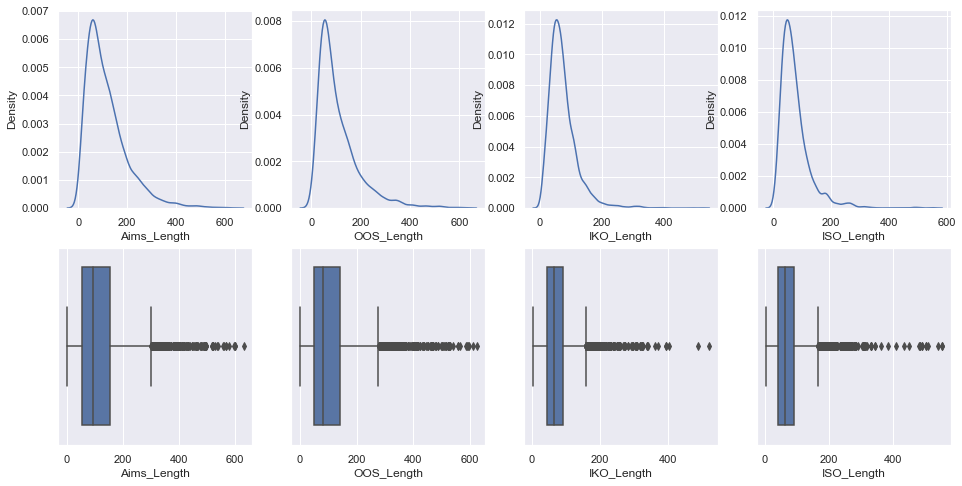

In [32]:
# function to get number of words in a document
def document_length(document):
    return len(str(document).split())

# get number of words in each natural language field, per record
modules_raw_reduced_nondummy['Aims_Length'] = modules_raw_reduced_nondummy['Aims'].apply(document_length)
modules_raw_reduced_nondummy['OOS_Length'] = modules_raw_reduced_nondummy['OutlineOfSyllabus'].apply(document_length)
modules_raw_reduced_nondummy['IKO_Length'] = modules_raw_reduced_nondummy['IntendedKnowledgeOutcomes'].apply(document_length)
modules_raw_reduced_nondummy['ISO_Length'] = modules_raw_reduced_nondummy['IntendedSkillOutcomes'].apply(document_length)

# distributions of document length in words, ignoring missing values
fig = plt.figure(figsize = (16, 8))
plt.subplot(2, 4, 1)
sns.kdeplot(modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['Aims'].notnull()]['Aims_Length'])
plt.subplot(2, 4, 2)
sns.kdeplot(modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['OutlineOfSyllabus'].notnull()]['OOS_Length'])
plt.subplot(2, 4, 3)
sns.kdeplot(modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['IntendedKnowledgeOutcomes'].notnull()]['IKO_Length'])
plt.subplot(2, 4, 4)
sns.kdeplot(modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['IntendedSkillOutcomes'].notnull()]['ISO_Length'])
plt.subplot(2, 4, 5)
sns.boxplot(x = modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['Aims'].notnull()]['Aims_Length'])
plt.subplot(2, 4, 6)
sns.boxplot(x = modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['OutlineOfSyllabus'].notnull()]['OOS_Length'])
plt.subplot(2, 4, 7)
sns.boxplot(x = modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['IntendedKnowledgeOutcomes'].notnull()]['IKO_Length'])
plt.subplot(2, 4, 8)
sns.boxplot(x = modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['IntendedSkillOutcomes'].notnull()]['ISO_Length'])
plt.show()

From the plots, we see that `Aims` and `OutlineOfSyllabus` are similarly distributed, and the same can be said for `IntendedKnowledgeOutcomes` and `IntendedSkillOutcomes`. Each of the fields has median word count of just less than 100, with `Aims` and `OutlineOfSyllabus` having a significant positive skew. All natural language fields contain many positively skewed outliers. These outliers are legitimate data, corresponding to modules with in-depth descriptions on their catalogue entries.

Many Transformer models place an upper limit on the number of input tokens that can be passed into the model. For example, BERT has a sequence limit of 512. This needs to be taken into account when deciding how precisely to preprocess these natural language fields.

The tokenisation process used here is quite rudimentary; after proper preprocessing we may find the distributions of document length to be different.

We now look at natural language values that have low word counts. While these short documents may not be missing values, they may be insufficient in information such that we should class them as missing. We ignore missing values for this.

In [33]:
# show low word count Aims values in order of ascending word count
modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['Aims'].notnull()].sort_values(by = 'Aims_Length').head(20)

,ModuleCode,Title,ShortTitle,IsNew,Semester1Offered,Semester1CreditValue,Semester2Offered,Semester2CreditValue,Semester3Offered,Semester3CreditValue,EctsCreditValue,FheqLevel,...,SchoolCode,TeachingLocation,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes,SapObjectId,Module_Id,Aims_Length,OOS_Length,IKO_Length,ISO_Length
949,MUS2039,Darmstadt and High Modernism,Darmstadt and High Modernism,False,True,20,False,0,False,0,10,3,...,D-SACS,Newcastle City Campus,Original Summary:,NaN,NaN,NaN,50832465,105568,2,1,1,1
1426,WUM8798,Writing Up Module Faculty of Medical Sciences (Semester 2),Writing Up Module MED (Semester 2),False,False,0,True,1,False,0,1,3,...,D-MSGS,Newcastle City Campus,Original Summary:,NaN,NaN,NaN,50732700,106067,2,1,1,1
625,FIN9004,Fine Art MLitt Dissertation,Fine Art MLitt Dissertation,False,False,0,True,40,True,40,40,7,...,D-SACS,Newcastle City Campus,Original Summary:,NaN,NaN,NaN,50344015,105218,2,1,1,1
603,FIN3031,Extended Study,Extended Study,False,False,0,True,20,False,0,10,3,...,D-SACS,Newcastle City Campus,Original Summary:,NaN,NaN,NaN,50794391,105196,2,1,1,1
1236,QLT0000,Quality test,Quality test,False,True,10,False,0,False,0,5,3,...,S-SASQ,Malaysia,Original Summary:,NaN,NaN,NaN,51443509,105873,2,1,1,1
1427,WUM8799,Writing Up Module Faculty of Medical Sciences (Semester 1),Writing Up Module MED (Semester 1),False,True,1,False,0,False,0,1,3,...,D-SME,Newcastle City Campus,Original Summary:,NaN,NaN,NaN,50732624,106068,2,1,1,1
2906,MCH2072,Radio Studies,Radio Studies,False,False,0,True,20,False,0,10,3,...,D-SACS,Newcastle City Campus,Original Summary:,NaN,NaN,NaN,52154077,107723,2,1,1,1
991,MUS3046,World Popular Musics,World Popular Musics,False,False,0,True,20,False,0,10,3,...,D-SACS,Newcastle City Campus,Original Summary:,NaN,NaN,NaN,51606078,105610,2,1,1,1
1425,WUM8797,Writing Up Module Faculty of Medical Sciences (full-year),Writing Up Module MED (full-year),False,True,1,True,1,True,1,2,3,...,D-MSGS,Newcastle City Campus,Original Summary:,NaN,NaN,NaN,50732701,106066,2,1,1,1
999,MUS3060,Minor Specialist Study 2,Minor Specialist Study 2,False,True,10,True,10,False,0,10,6,...,D-SACS,Newcastle City Campus,Original Summary:,NaN,NaN,NaN,50345761,105618,2,1,1,1


In [34]:
# show low word count OutlineOfSyllabus values in order of ascending word count
modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['OutlineOfSyllabus'].notnull()].sort_values(by = 'OOS_Length').head(20)

,ModuleCode,Title,ShortTitle,IsNew,Semester1Offered,Semester1CreditValue,Semester2Offered,Semester2CreditValue,Semester3Offered,Semester3CreditValue,EctsCreditValue,FheqLevel,...,SchoolCode,TeachingLocation,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes,SapObjectId,Module_Id,Aims_Length,OOS_Length,IKO_Length,ISO_Length
3115,LPG1303,University Wide Language Programme: German Upper intermediate 2,UWLP German Upper Intermediate 2,False,False,0,True,10,False,0,5,4,...,D-SMLS,Newcastle City Campus,"By the end of the course, students will:\r\n\r\ni. begin to communicate fluently and accurately in the foreign language, in both spoken and written form;\r\nii. be prepared for the kind of situations which they are likely to encounter when working or studying abroad;\r\niii. be able to express their opinions on cultural, social and political issues.\r\n\r\nThis is the second part of a German Upper Intermediate course designed with the non language specialist in mind. It is open to students who have obtained an A-Level Grade C or below, who received a GCSE grade in the past and undertook self-study or lived in a German-speaking country since. It is also open to students who have no formal qualification in the foreign language but feel they can communicate fairly fluently but have not reached the Advanced stage yet. The module covers the four skills: writing, reading, speaking and listening. At the end of the module, students will have gained a body of vocabulary and grammatical structures sufficient to allow them to communicate orally and in writing with confidence at an intermediate level (B1 on the Common European Framework of Reference for Languages).",TBA,"All areas of grammar, vocabulary and background knowledge related to the skills listed below.","Speaking:\r\nTo develop further the skill of speaking so that by the end of the module students will feel confident about communicating with native speakers. This will go beyond dealing with everyday situations – students will be expected to express their views on more complex topics.\r\nListening:\r\nTo reinforce the students’ listening skills by regularly listening to (mostly) authentic broadcasts from the radio and television (this could include interviews, reports or film extracts).\r\nWriting:\r\nTo reinforce the students’ ability to write reports, essays and letters in the foreign language.\r\nReading:\r\nTo reinforce the students’ reading skills through a variety of more complex authentic materials than studied previously in the target language.\r\n\r\nGammar/Vocabulary:\r\n•\tTo further their command of grammar and to introduce and practise more complex structures\r\n•\tTo help expan their vocabulary to areas which go beyond basic “everyday use” of the foreign language",52182066,107938,192,1,14,145
3111,LPC1203,University Wide Language Programme: Chinese Lower Intermediate 2,UWLP Chinese Lower Intermediate 2,False,False,0,True,10,False,0,5,4,...,D-SMLS,Newcastle City Campus,"The aim of the course is to provide students with:\r\n\r\ni. The skills of listening, reading, writing and speaking, reinforced and expanded beyond the stereotypical, predictable situations that are presented at lower levels through regular exposure to authentic materials (i.e. produced for native speakers);\r\nii. An awareness of linguistic accuracy and the ability to monitor their language output accordingly;\r\niii. An ability to deal with the situations that they are most typically likely to encounter when working or studying abroad;\r\niv. An ability to apply the language they know to their personal experience;\r\n\r\nThis is the second part of a Chinese Lower Intermediate course designed with the non language specialist in mind. It is open to students wishing to study Chinese at post-GCSE. The module covers the four skills: writing, reading, speaking and listening. At the end of the module, students will have gained a body of vocabulary and grammatical structures sufficient to all

In [35]:
# show low word count IntendedKnowledgeOutcomes values in order of ascending word count
modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['IntendedKnowledgeOutcomes'].notnull()].sort_values(by = 'IKO_Length').head(20)

,ModuleCode,Title,ShortTitle,IsNew,Semester1Offered,Semester1CreditValue,Semester2Offered,Semester2CreditValue,Semester3Offered,Semester3CreditValue,EctsCreditValue,FheqLevel,...,SchoolCode,TeachingLocation,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes,SapObjectId,Module_Id,Aims_Length,OOS_Length,IKO_Length,ISO_Length
840,LAW3098,Dissertation in Law,Dissertation in Law,False,True,20,True,20,False,0,20,6,...,D-SLAW,Newcastle City Campus,"(1) To present an opportunity to undertake research on a specific legal, socio-legal or legally related topic working largely alone, and to present in a structured form the results of that research. The research may be of an empirical or library based nature, or be a combination of each. \r\n\r\n(2) To give an opportunity to profit from pursuing studies outside of taught courses; to develop the student's interest in areas of and approaches to legal study which may not be covered in taught courses. \r\n\r\n(3) The opportunity to be assessed on the basis of skills different from those required for a traditional examination.\r\n\r\n(4) To provide an opportunity to demonstrate organisational and planning skills together with initiative.",This module is a research module and as such does not contain involved teaching of a prescribed syllabus content.,Specific to approved title,"Subject Specific Skills \r\n\r\n(1) Ability to write with care and precision in the analysis and synthesis of the law. \r\n\r\n(2) Ability to structure argument and analysis. \r\n\r\n(3) Ability to identify issues for research and to retrieve accurate and relevant legal and other sources in primary and secondary form, both in paper and digital formats. \r\n\r\nCognitive Skills \r\n\r\n(1) Analysis. Identifying and ordering issues by relevance and importance \r\n\r\n(2) Synthesis of materials from diverse sources. \r\n\r\n(3) Critical judgment. Discernment between the merits or otherwise of particular arguments. \r\n\r\n(4) Evaluation. Making a reasoned choice between competing solutions or arguments.",50344795,105446,117,19,4,96
4484,LAW3298,Dissertation in Law,Dissertation in Law,False,True,20,True,20,False,0,20,6,...,D-SLAW,Newcastle City Campus,"(1) To present an opportunity to undertake research on a specific legal, socio-legal or legally related topic working largely alone, and to present in a structured form the results of that research. The research may be of an empirical or library based nature, or be a combination of each. (2) To give an opportunity to profit from pursuing studies outside of taught courses; to develop the student's interest in areas of and approaches to legal study which may not be covered in taught courses. (3) The opportunity to be assessed on the basis of skills different from those required for a traditional examination. (4) To provide an opportunity to demonstrate organisational and planning skills together with initiative.",This module is a research module and as such does not contain involved teaching of a prescribed syllabus content.,Specific to approved title,"Subject Specific Skills (1) Ability to write with care and precision in the analysis and synthesis of the law. (2) Ability to structure argument and analysis. (3) Ability to identify issues for research and to retrieve accurate and relevant legal and other sources in primary and secondary form, both in paper and digital formats. Cognitive Skills (1) Analysis. Identifying and ordering issues by relevance and importance (2) Synthesis of materials from diverse sources. (3) Critical judgment. Discernment between the merits or otherwise of particular arguments. (4) Evaluation. Making a reasoned choice between competing solutions or arguments.",52958594,109404,117,19,4,96
2478,ECO1089,Introductory Economics (Study Abroad S1),Introductory Economics (SA Sem 1),False,True,10,False,0,False,0,5,4,...,D-NUBS,Newcastle City Campus,To introduce basic concepts in economics to students not progressing to study degree in econom

In [36]:
# show low word count IntendedSkillOutcomes values in order of ascending word count
modules_raw_reduced_nondummy[modules_raw_reduced_nondummy['IntendedSkillOutcomes'].notnull()].sort_values(by = 'ISO_Length').head(20)

,ModuleCode,Title,ShortTitle,IsNew,Semester1Offered,Semester1CreditValue,Semester2Offered,Semester2CreditValue,Semester3Offered,Semester3CreditValue,EctsCreditValue,FheqLevel,...,SchoolCode,TeachingLocation,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes,SapObjectId,Module_Id,Aims_Length,OOS_Length,IKO_Length,ISO_Length
2771,SEL8536,Literary Geographies,Literary Geographies,False,True,20,False,0,False,0,10,7,...,D-SELS,Newcastle City Campus,"This module explores how authors and texts articulate their relationship to shifting geographies of cultural power, literary canon formation, and readership. How has literary production and consumption been shaped by ideas of ‘centre’ and ‘periphery’, ‘metropole’ and ‘margins’? Has globalization displaced or consolidated what Casanova calls the ‘Greenwich Meantime of Literature’? By pursuing a range of texts that move between cultural centres and peripheries, students will be encouraged to grapple with literary texts as sites of territorialisation, movement and disorientation in order to think about the critical questions of value and canonicity. The focus will be on material from the late 19th, 20th and 21st centuries, depending on the research specialisms of teaching staff.","For details of primary texts please refer to the module guide for the current academic year.\r\n\r\nIndicative background reading might include:\r\n\r\nPascale Casanova's The World Republic of Letters (2004)\r\n\r\nFranco Moretti's Graphs, Maps, Trees (2007)","To provide a better understanding of literary texts as geographically situated yet mobile sites of investigation and what this means in both theory and practice.\r\n\r\nTo increase awareness of literary questions of canonicity and the cultural construction of literary value in relation to the contested geographical/conceptual categories of ‘centre’/’margin’, ‘metropole’ and ‘periphery’\r\n\r\nTo introduce and provide a preliminary grounding in current debates on contemporary literature as a ‘world’, ‘global’, 'diasporic' or ‘post-colonial’ formation.",Improved literary/analytical skills,52051703,107579,114,35,73,3
1920,EXT8011,Hydraulic and Pumping Systems,Principles of Hydraulics & Water Distrib,False,True,10,False,0,False,0,5,8,...,D-SENG,Off Campus,To provide the foundation in hydraulics and an understanding of pumping systems with reference to water and wastewater treatment flow sheets.,"Principles of channel flows, weir and flumes.\r\nHydraulic profiling.\r\nFlow distribution, divisions and combination.\r\nFlow through hydraulic structures and unit process.\r\nTime varying flows through treatment works.\r\nPump system calculation.\r\nPrinciples and sizing of pumps.\r\nSludge pumping systems.\r\nPumping station design.\r\nPump maintenance.",On successful completion of this module the student should be able to:-\r\n\r\n\r\n1.\tCalculate hydraulic profile through a treatment works.\r\n2.\tDesign flow division and combination devices.\r\n3.\tUnderstand the effects of flow variations through a treatment works.\r\n4.\tSelect and size appropriate pumps for different applications.,Critically assess research results.,51492229,106589,21,43,47,4
4734,MKT1999,Academic Tutoring,Academic Tutoring,False,True,0,False,0,False,0,0,4,...,D-NUBS,Newcastle City Campus,1.\tDeveloping a supportive framework for students to make the most of their time as a student in NUBS\r\n2.\tTo induct students into the research culture of Marketing through facilitated research talks from research active staff\r\n3.\tFor students to gain an appreciation of the process of research from real world examples and understand its importance and impact,•\tWelcome to NUBS\r\n•\tHow you will learn\r\n•\tIntroduction to Canvas\r\n•\tBecoming a successful NUBS student\r\n•\tResearching and managing information*\r\n•\tResearch Mini-series (1)\r\n•\tProject Management\r\n•\tIntroducing NUBS Global Graduate Attributes and Developing your cultural competence\r\n•\tImpact of research\r\

We note a few values we can treat as missing:

 - Aims: `Original Summary:`.
 - OutlineOfSyllabus: `TBA`; `See above.`; `Not applicable`.
 - IntendedKnowledgeOutcomes: `Specific to approved title`.
 
Records with `Original Summary:` under `Aims` have other natural language fields that take missing values. Despite these records not having `IsDummy` as `True`, we should discount these records for having a lack of semantic information.

What might be a worthwhile exercise is term frequency analysis binned by `SchoolCode`, to see what terms occur frequently in modules under university schools. For this, we will exclude stopwords. Retaining stopwords is important during modelling so that the model can capture the semantic information within records fully, however these stopwords are uninteresting for term frequency analysis. We consider some basic preprocessing here.

In [37]:
# function to bring natural language into lowercase, remove stopwords, remove some special characters and tokenise
def preprocess_basic(document):
    document = str(document)
    document = document.lower()
    document = document.replace('\n', ' ')
    document = document.replace('\t', '')
    document = document.replace('\t', '')
    document = ' '.join([word for word in document.split() if word not in stopwords.words('english')])
    document = document.split()
    return document

# get SchoolCode and natural language fields
modules_nl = modules_raw_reduced_nondummy[['SchoolCode', 'Aims', 'OutlineOfSyllabus', 'IntendedKnowledgeOutcomes', 'IntendedSkillOutcomes']]

# combine natural language fields
modules_nl['NL'] = modules_nl['Aims'].astype(str) + ' ' + \
                   modules_nl['OutlineOfSyllabus'].astype(str) + ' ' + \
                   modules_nl['IntendedKnowledgeOutcomes'].astype(str) + ' ' + \
                   modules_nl['IntendedSkillOutcomes'].astype(str)

# preprocess the natural language
modules_nl['NL'] = modules_nl['NL'].apply(preprocess_basic)

C:\Users\Luke\AppData\Local\Temp\ipykernel_9392\4188979278.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  modules_nl['NL'] = modules_nl['Aims'].astype(str) + ' ' + \
C:\Users\Luke\AppData\Local\Temp\ipykernel_9392\4188979278.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  modules_nl['NL'] = modules_nl['NL'].apply(preprocess_basic)


In [38]:
# verify preprocessing has worked correctly
modules_nl

,SchoolCode,Aims,OutlineOfSyllabus,IntendedKnowledgeOutcomes,IntendedSkillOutcomes,NL
0,D-NUBS,"To introduce students to economic issues and decision-making tools, relating to major topics like demand analysis and estimation, production and cost functions, and decision making with differing market structures.","OPTIMISATION: A BRIEF REVIEW\r\n\r\nCONSUMPTION & DEMAND\r\n•\tAxioms of traditional consumer theory\r\n• Quantitative demand analysis\r\n•\tIndifference curves, consumption decisions and demand\r\n\r\nPRODUCTION, COSTS & SUPPLY\r\n•\tEconomic analysis of production\r\n•\tCost functions\r\n• The organization of the firm\r\n\r\nMARKET STRUCTURE & PERFORMANCE OUTCOMES\r\n•\tMonopoly, price discrimination and welfare\r\n•\tMonopolistic competition\r\n•\tModels of Oligopoly: Cournot; Stackelberg; The kinked demand curve\r\n• Game theory\r\n\t\r\nMARKET STRUCTURE, FIRM STRATEGY & PERFORMANCE\r\n•\tEmpirical evidence on SCP paradigm and concentration - profitability\r\n•\tResource based view of the Firm\r\n•\tPersistance of profit\r\n\t\r\nANALYSIS OF FIRM STRATEGY\r\n•\tProduct differentiation\r\n•\tAdvertising\r\n•\tBarriers to entry\r\n\r\nTHEORIES OF THE FIRM\r\n•\tNeoclassical\r\n•\tBehavioural\r\n•\tTransaction-costs perspectives","At the end of this module students will be able to:\r\n•\tDemonstrate a conceptual understanding of business economics, and distinguish some difference from accounting concepts.\r\n•\tAnalyse the economic aspects of the nature of competition and behaviour of firms in an industry, and appraise their implications for the competitive strategies and performance of businesses.\r\n•\tApply economic techniques in managerial decision making, but also illustrate the limitations implicit in such techniques.","At the end of this module students will be able to:\r\n•\tDevelop independent learning to prepare a written report.\r\n•\tDevelop quantitative skills to practice the using of statistical software, employ the appropriate models to analyse the data, and interpret the empirical findings.\r\n•\tAnalyse different market structures and equilibrium outcomes in each of them.","[introduce, students, economic, issues, decision-making, tools,, relating, major, topics, like, demand, analysis, estimation,, production, cost, functions,, decision, making, differing, market, structures., optimisation:, brief, review, consumption, &, demand, •axioms, traditional, consumer, theory, •, quantitative, demand, analysis, •indifference, curves,, consumption, decisions, demand, production,, costs, &, supply, •economic, analysis, production, •cost, functions, •, organization, firm, market, structure, &, performance, outcomes, •monopoly,, price, discrimination, welfare, •monopolistic, competition, •models, oligopoly:, cournot;, stackelberg;, kinked, demand, curve, •, game, theory, market, structure,, firm, strategy, &, performance, •empirical, evidence, scp, paradigm, concentration, -, profitability, •resource, based, view, firm, •persistance, profit, analysis, firm, strategy, •product, differentiation, •advertising, •barriers, entry, ...]"
1,D-NUBS,(a) To provide a framework of the methods and techniques of management accounting and control.\r\n\r\n(b) To provide a framework for an understanding of the design and operation of management accounting and control systems by considering conceptual and practical issues involved.,The module is delivered by means of a series of lectures and seminars.\r\n\r\nIt covers:\r\nResearch methodologies of management accounting \r\nCosting (including ABC)\r\nPlanning and control systems (including budgeting and beyond budgeting)\r\nPerformance management system\r\nCurrent issues and transfer pricing,By the end of the module students will be able to : \r\n\r\n- Demonstrate an understanding of the issues involved in designing and operating management accounting and control systems that require to serve diverse purposes. \r\n\r\n- Examine current research issues in management accounting.,"By t

In [40]:
# group words by SchoolCode 
modules_nl_grouped = modules_nl[['SchoolCode', 'NL']].groupby('SchoolCode')['NL'].apply(list).apply(np.concatenate)

# get counts of each word, per SchoolCode
word_counts_per_school = modules_nl_grouped.apply(pd.value_counts)

word_counts_per_school

,students,module,able,to:,research,•,skills,knowledge,understanding,human,completion,health,...,pros/cons,directories,"highfliers,",leavers,destination,•incremental,•effectuation,•spotting,ventures/products/services.,desirability.,lp,sap
SchoolCode,,,,,,,,,,,,,,,,,,,,,,,,,
D-BNS,575.0,573.0,333.0,292.0,284.0,276.0,231.0,216.0,194.0,193.0,178.0,171.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
D-COMP,357.0,306.0,509.0,161.0,307.0,113.0,223.0,166.0,130.0,54.0,15.0,9.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
D-DENT,91.0,91.0,44.0,36.0,58.0,283.0,74.0,87.0,103.0,NaN,42.0,33.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
D-ECLS,895.0,705.0,585.0,121.0,875.0,1005.0,401.0,537.0,653.0,33.0,30.0,110.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
D-HSSO,13.0,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
D-INLO,1.0,1.0,1.0,1.0,NaN,27.0,2.0,NaN,2.0,NaN,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
D-INRP,12.0,6.0,2.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
D-INTO,506.0,341.0,214.0,127.0,139.0,479.0,402.0,138.0,151.0,26.0,65.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
D-LIBR,34.0,27.0,7.0,6.0,7.0,NaN,30.0,15.0,13.0,NaN,5.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


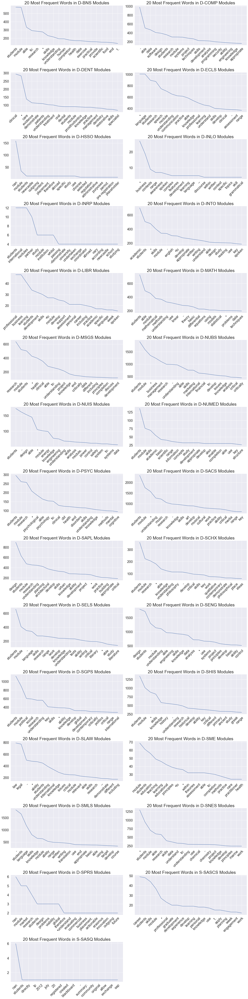

In [41]:
# plot word counts, per SchoolCode
fig = plt.figure(figsize = (20, 80))
for i in range(word_counts_per_school.shape[0]):
    ax = fig.add_subplot(15, 2, i + 1)
    plt.plot(word_counts_per_school.iloc[i].sort_values(ascending = False)[0:20])
    ax.tick_params(axis='x', labelsize = 20)
    plt.setp(ax.get_xticklabels(), rotation = 45, ha = 'right', rotation_mode = 'anchor')
    ax.tick_params(axis='y', labelsize = 20)
    plt.title(f'20 Most Frequent Words in {word_counts_per_school.index[i]} Modules', fontsize = 25)
fig.tight_layout()

Due to the rudimentary nature of the preprocessing, we note a few erroneous words such as `-`, `1.` and `•`. As this analysis is exploratory, we can simply ignore them; more rigorous preprocessing will be done in preparation for modelling. It does help to highlight some of the artefacts that can escape basic preprocessing.

Words related to learning, such as `students`, `module` and `understanding`, are seen consistently across university schools, however considering the context of the data, these can essentially be seen as stopwords as well. Their appearance in these plots is a consequence of using a generic set of stopwords. There are notable domain-specific words that appear frequently, such as `chemical`, `politics`, `architectural` and `business`. If, for example, a computing module included the word `business` in its natural language, then the model might find the module similar to business modules, which is desirable for the outcomes of this project.